# Glassdoor DataScience Job Listings

### The dataset captures a wide range of information related to job postings, including job titles, company details, job descriptions, required qualifications, location, salary ranges, and benefits. It is designed to facilitate research and analysis in the fields of human resources, labor market trends, and career development.

### importing libraries

In [1]:
import numpy as pd
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


### Reading the Data

In [2]:
job_data=pd.read_csv('Glassdoor_Job_Postings.csv')

In [3]:
job_data

,company,job_title,company_rating,job_description,location,salary_avg_estimate,salary_estimate_payperiod,company_size,company_founded,employment_type,industry,sector,revenue,career_opportunities_rating,comp_and_benefits_rating,culture_and_values_rating,senior_management_rating,work_life_balance_rating
0,ABB,Junior Data Analyst,4.0,Junior Data Analyst\nTake your next career ste...,Bengaluru,"₹3,25,236",/yr (est.),10000+ Employees,1883,Company - Public,Electronics Manufacturing,Manufacturing,$10+ billion (USD),3.7,3.6,4.0,3.5,3.9
1,Philips,Data Scientist - AI/ML,4.0,Job Title\nData Scientist - AI/ML\nJob Descrip...,Bengaluru,NaN,NaN,10000+ Employees,1891,Company - Public,Healthcare Services & Hospitals,Healthcare,$10+ billion (USD),3.8,3.7,4.0,3.5,4.0
2,HSBC,Data Science GSC’s,3.9,Job description\nGraduate/ Post-graduate degre...,Bengaluru,NaN,NaN,10000+ Employees,1865,Company - Public,Banking & Lending,Finance,$10+ billion (USD),3.6,3.6,3.8,3.4,3.7
3,Facctum Solutions,Data Analyst,NaN,Job Description\nExperience: 0 - 2 years in da...,Karnataka,NaN,NaN,1 to 50 Employees,--,Company - Private,--,--,Unknown / Non-Applicable,NaN,NaN,NaN,NaN,NaN
4,JPMorgan Chase & Co,Data and Analytics - Associate,4.0,JOB DESCRIPTION\n\nYou are a strategic thinker...,India,NaN,NaN,10000+ Employees,1799,Company - Public,Banking & Lending,Finance,$10+ billion (USD),4.0,3.9,3.9,3.6,3.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
895,Kpro Solutions,Analytics & Data Science,4.0,Experience & Qualification:\n\nMinimum of 9 ye...,Bengaluru,"₹4,83,915",/yr (est.),1 to 50 Employees,--,Company - Private,--,--,Unknown / Non-Applicable,4.0,4.0,4.0,4.0,4.0
896,Athena Global Technologies,Data Engineer,NaN,Immediate requirement for Data Engineer\nExper...,Hyderābād,"₹6,78,949",/yr (est.),51 to 200 Employees,--,Company - Private,--,--,Unknown / Non-Applicable,4.2,3.5,4.0,3.9,3.9
897,Wesco,India-Bangalore: Data Engineer,3.7,This person will work independently or with a ...,Bengaluru,"₹6,51,920",/yr (est.),10000+ Employees,1922,Company - Public,Wholesale,Retail & Wholesale,$10+ billion (USD),3.5,3.4,3.6,3.3,3.8
898,Course5,Data Scientist,4.2,If you meet our position requirements and can ...,Bengaluru,"₹4,24,426",/yr (est.),1001 to 5000 Employees,2000,Company - Private,Business Consulting,Management & Consulting,$100 to $500 million (USD),4.3,4.1,4.3,4.1,4.2


In [ ]:
### shape of the data

In [4]:
job_data.shape

(900, 18)

In [ ]:
#### we have 18 columns and 900 rows

In [5]:
job_data.describe()

,company_rating,career_opportunities_rating,comp_and_benefits_rating,culture_and_values_rating,senior_management_rating,work_life_balance_rating
count,656.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,3.948171,3.838304,3.678796,3.903010,3.677702,3.804378
std,0.440294,0.520020,0.525854,0.545233,0.589133,0.559777
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,3.700000,3.600000,3.400000,3.600000,3.300000,3.600000
50%,4.000000,3.800000,3.700000,3.900000,3.600000,3.800000
75%,4.200000,4.100000,4.000000,4.200000,4.000000,4.100000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [6]:
job_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   company                      899 non-null    object 
 1   job_title                    900 non-null    object 
 2   company_rating               656 non-null    float64
 3   job_description              888 non-null    object 
 4   location                     900 non-null    object 
 5   salary_avg_estimate          636 non-null    object 
 6   salary_estimate_payperiod    636 non-null    object 
 7   company_size                 774 non-null    object 
 8   company_founded              774 non-null    object 
 9   employment_type              774 non-null    object 
 10  industry                     774 non-null    object 
 11  sector                       774 non-null    object 
 12  revenue                      774 non-null    object 
 13  career_opportunities

In [ ]:
## Cleaining the data and making it more appropriate for the data analysis

In [ ]:
### tge salary avg estimate column is easier to eavluate if its in int/float format

In [7]:
job_data['salary_avg_estimate'] = pd.to_numeric(job_data['salary_avg_estimate'].str.replace('[₹,]', '', regex=True), errors='coerce')

job_data['company_founded'] = pd.to_datetime(job_data['company_founded'], errors='coerce')


In [ ]:
### lets divide the columns into categorical and numerical sets

In [ ]:
# Level 1 analysis

In [11]:
def seperate_datatypes(data):
    cat=[]
    num=[]
    for col in data.columns:
        if data[col].nunique()<25:
            cat.append(col)
        else:
            num.append(col)
    return cat,num

In [12]:
categorical, numerical=seperate_datatypes(job_data)


In [13]:
categorical

['salary_estimate_payperiod',
 'company_size',
 'employment_type',
 'sector',
 'revenue']

In [14]:
numerical

['company',
 'job_title',
 'company_rating',
 'job_description',
 'location',
 'salary_avg_estimate',
 'company_founded',
 'industry',
 'career_opportunities_rating',
 'comp_and_benefits_rating',
 'culture_and_values_rating',
 'senior_management_rating',
 'work_life_balance_rating']

In [ ]:
# level 1 analysis

In [ ]:
### checking for null values


In [15]:
job_data.isnull().sum()

company                          1
job_title                        0
company_rating                 244
job_description                 12
location                         0
salary_avg_estimate            264
salary_estimate_payperiod      264
company_size                   126
company_founded                333
employment_type                126
industry                       126
sector                         126
revenue                        126
career_opportunities_rating    169
comp_and_benefits_rating       169
culture_and_values_rating      169
senior_management_rating       169
work_life_balance_rating       169
dtype: int64

In [ ]:
## treating null values

In [ ]:
job_data

In [16]:
columns_to_drop_null = ['company', 'job_description']
job_data = job_data.dropna(subset=columns_to_drop_null)



import numpy as np

job_data.replace('--', np.nan, inplace=True)

categorical_columns = job_data.select_dtypes(include=['object']).columns
numerical_columns = job_data.select_dtypes(include=['number']).columns
date_columns = job_data.select_dtypes(include=['datetime64']).columns


for column in categorical_columns:
    mode_value = job_data[column].mode()[0]
    job_data[column].fillna(mode_value, inplace=True)

for column in numerical_columns:
    mean_value = job_data[column].mean()
    job_data[column].fillna(mean_value, inplace=True)

job_data[date_columns] = job_data[date_columns].apply(lambda x: x.fillna('2022-01-01'))

    




/var/folders/97/r06tw6zs1pgcx5z2qp9mf0q00000gn/T/ipykernel_3853/2539042307.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  job_data.replace('--', np.nan, inplace=True)
/var/folders/97/r06tw6zs1pgcx5z2qp9mf0q00000gn/T/ipykernel_3853/2539042307.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  job_data[column].fillna(mode_value, inplace=True)
/var/folders/97/r06tw6zs1pgcx5z2qp9mf0q00000gn/T/ipykernel_3853/2539042307.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

In [ ]:
### lets check for missing values again

In [17]:
job_data.isnull().sum()

company                        0
job_title                      0
company_rating                 0
job_description                0
location                       0
salary_avg_estimate            0
salary_estimate_payperiod      0
company_size                   0
company_founded                0
employment_type                0
industry                       0
sector                         0
revenue                        0
career_opportunities_rating    0
comp_and_benefits_rating       0
culture_and_values_rating      0
senior_management_rating       0
work_life_balance_rating       0
dtype: int64

In [18]:
job_data

,company,job_title,company_rating,job_description,location,salary_avg_estimate,salary_estimate_payperiod,company_size,company_founded,employment_type,industry,sector,revenue,career_opportunities_rating,comp_and_benefits_rating,culture_and_values_rating,senior_management_rating,work_life_balance_rating
0,ABB,Junior Data Analyst,4.000000,Junior Data Analyst\nTake your next career ste...,Bengaluru,325236.00000,/yr (est.),10000+ Employees,1883-01-01,Company - Public,Electronics Manufacturing,Manufacturing,$10+ billion (USD),3.700000,3.600000,4.000000,3.500000,3.900000
1,Philips,Data Scientist - AI/ML,4.000000,Job Title\nData Scientist - AI/ML\nJob Descrip...,Bengaluru,617111.55538,/yr (est.),10000+ Employees,1891-01-01,Company - Public,Healthcare Services & Hospitals,Healthcare,$10+ billion (USD),3.800000,3.700000,4.000000,3.500000,4.000000
2,HSBC,Data Science GSC’s,3.900000,Job description\nGraduate/ Post-graduate degre...,Bengaluru,617111.55538,/yr (est.),10000+ Employees,1865-01-01,Company - Public,Banking & Lending,Finance,$10+ billion (USD),3.600000,3.600000,3.800000,3.400000,3.700000
3,Facctum Solutions,Data Analyst,3.946512,Job Description\nExperience: 0 - 2 years in da...,Karnataka,617111.55538,/yr (est.),1 to 50 Employees,2022-01-01,Company - Private,Information Technology Support Services,Information Technology,Unknown / Non-Applicable,3.839669,3.678926,3.903581,3.679477,3.804683
4,JPMorgan Chase & Co,Data and Analytics - Associate,4.000000,JOB DESCRIPTION\n\nYou are a strategic thinker...,India,617111.55538,/yr (est.),10000+ Employees,1799-01-01,Company - Public,Banking & Lending,Finance,$10+ billion (USD),4.000000,3.900000,3.900000,3.600000,3.700000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
895,Kpro Solutions,Analytics & Data Science,4.000000,Experience & Qualification:\n\nMinimum of 9 ye...,Bengaluru,483915.00000,/yr (est.),1 to 50 Employees,2022-01-01,Company - Private,Information Technology Support Services,Information Technology,Unknown / Non-Applicable,4.000000,4.000000,4.000000,4.000000,4.000000
896,Athena Global Technologies,Data Engineer,3.946512,Immediate requirement for Data Engineer\nExper...,Hyderābād,678949.00000,/yr (est.),51 to 200 Employees,2022-01-01,Company - Private,Information Technology Support Services,Information Technology,Unknown / Non-Applicable,4.200000,3.500000,4.000000,3.900000,3.900000
897,Wesco,India-Bangalore: Data Engineer,3.700000,This person will work independently or with a ...,Bengaluru,651920.00000,/yr (est.),10000+ Employees,1922-01-01,Company - Public,Wholesale,Retail & Wholesale,$10+ billion (USD),3.500000,3.400000,3.600000,3.300000,3.800000
898,Course5,Data Scientist,4.200000,If you meet our position requirements and can ...,Bengaluru,424426.00000,/yr (est.),1001 to 5000 Employees,2000-01-01,Company - Private,Business Consulting,Management & Consulting,$100 to $500 million (USD),4.300000,4.100000,4.300000,4.100000,4.200000


In [19]:
## Univariate Analysis for Categorical Columns

 ['salary_estimate_payperiod',
 'company_size',
 'employment_type',
 'sector',
 'revenue']

1. salary_estimate_payperiod

In [20]:
job_data['salary_estimate_payperiod'].value_counts()

salary_estimate_payperiod
/yr (est.)    818
/mo (est.)     68
/hr (est.)      2
Name: count, dtype: int64

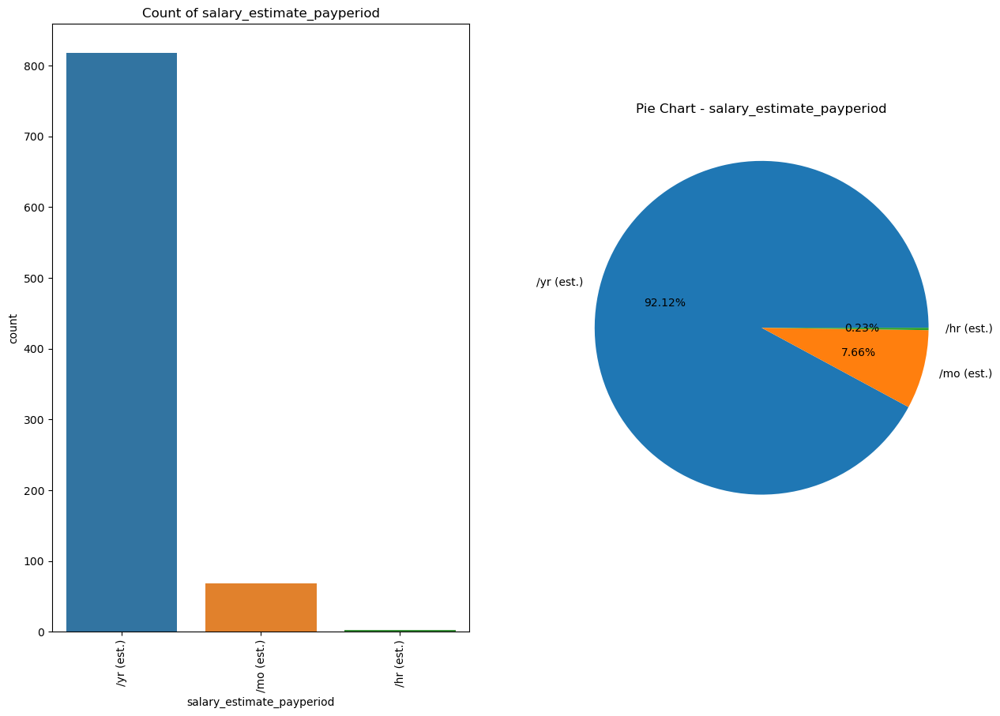

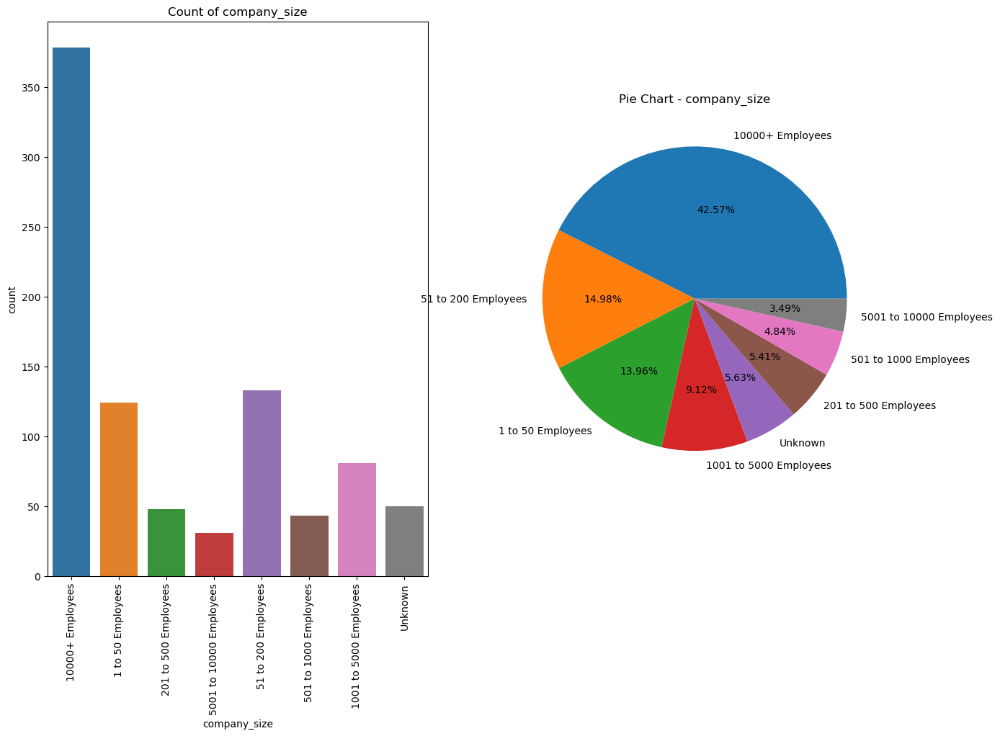

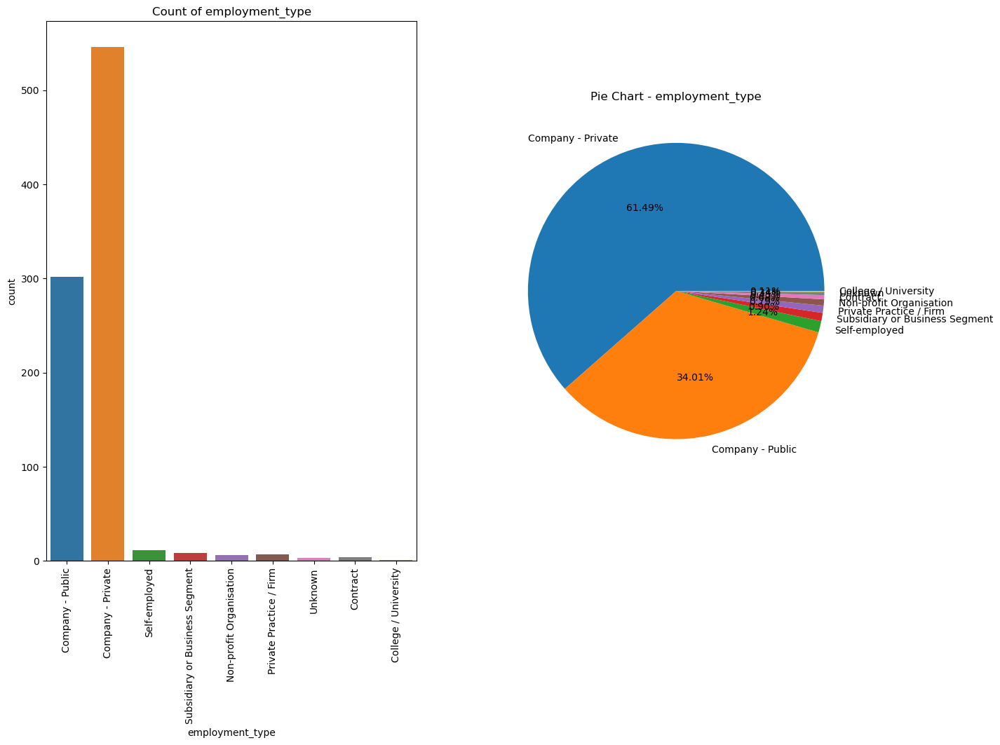

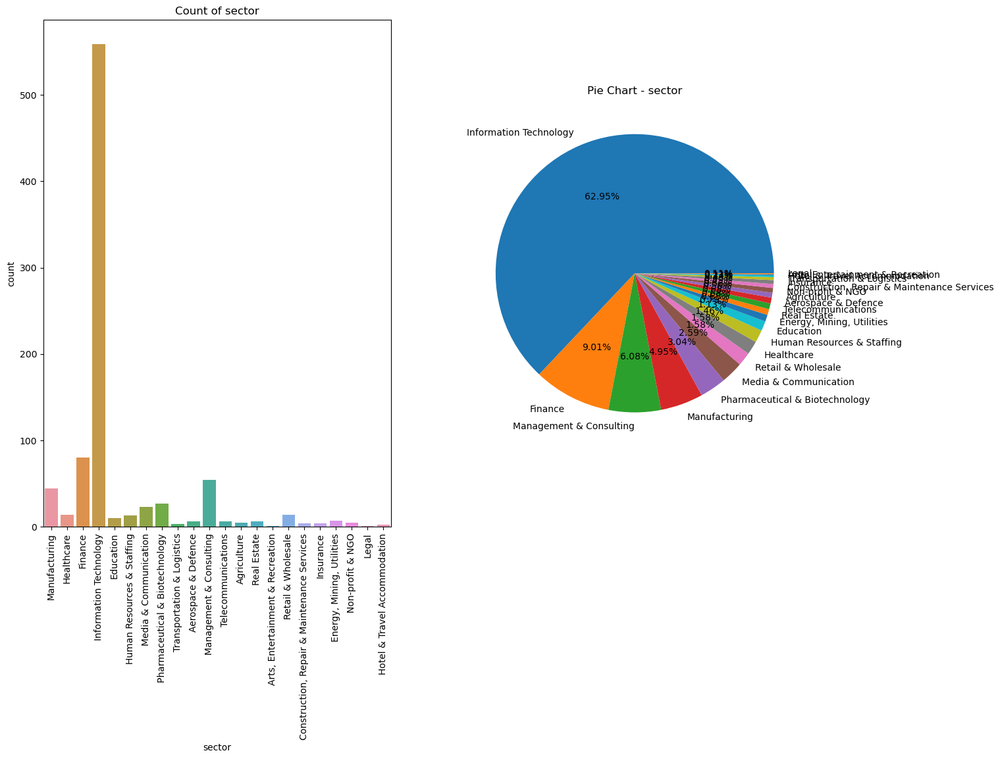

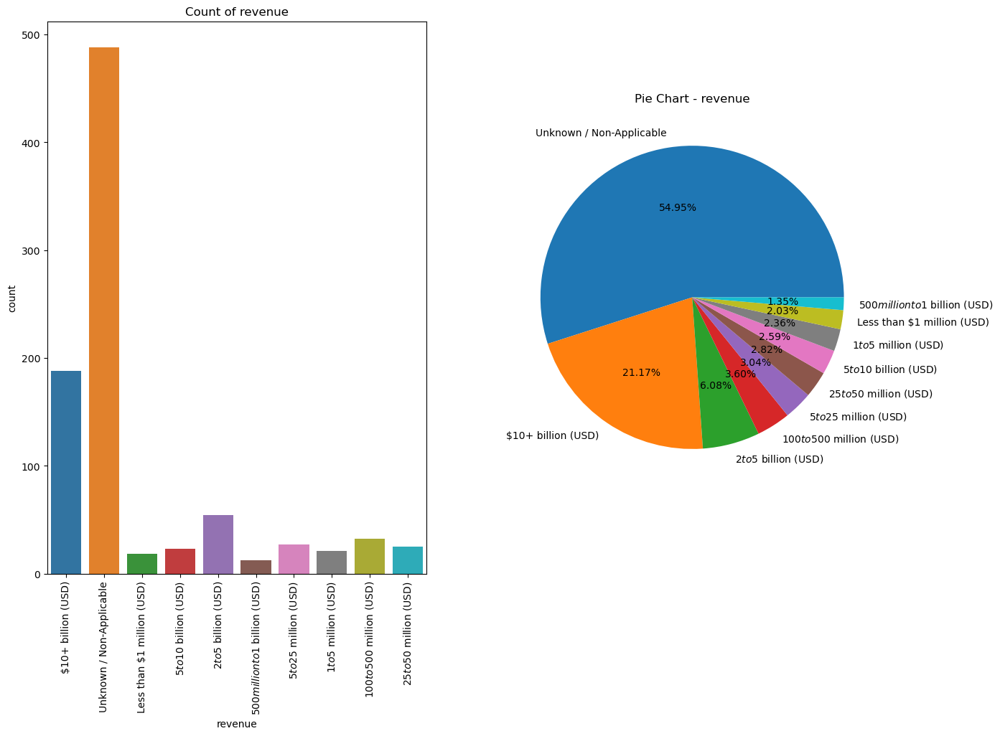

In [23]:


def plot_categorical_columns(data, categorical_columns):
    
    for column in categorical_columns:
        fig, ax = plt.subplots(1, 2, figsize=(15, 10))

        ax[0].set_title(f'Count of {column}')
        counts = data[column].value_counts()
        sns.countplot(x=data[column], ax=ax[0])

        labels = list(counts.index)
        ax[1].set_title(f'Pie Chart - {column}')
        ax[1].pie(counts, labels=labels, autopct='%0.2f%%')

        ax[0].tick_params(axis='x', rotation=90)
        plt.show()


categorical_columns_to_plot = ['salary_estimate_payperiod',
 'company_size',
 'employment_type',
 'sector',
 'revenue']
plot_categorical_columns(job_data, categorical_columns_to_plot)



In [24]:
## different charts to explain the distribution of data

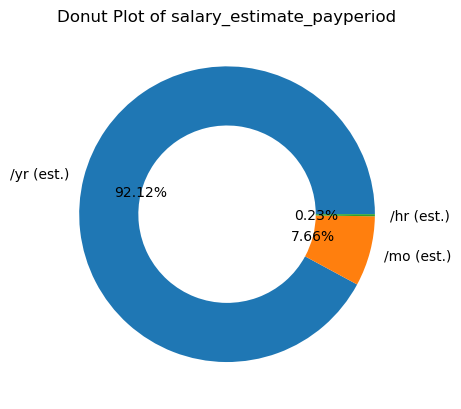

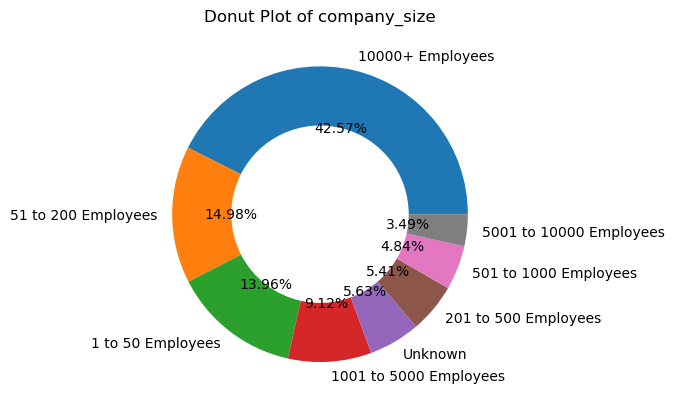

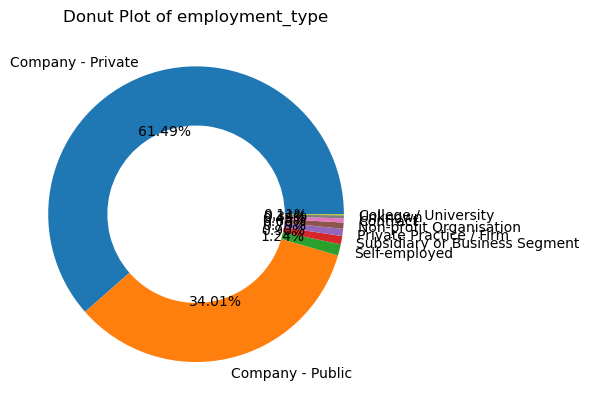

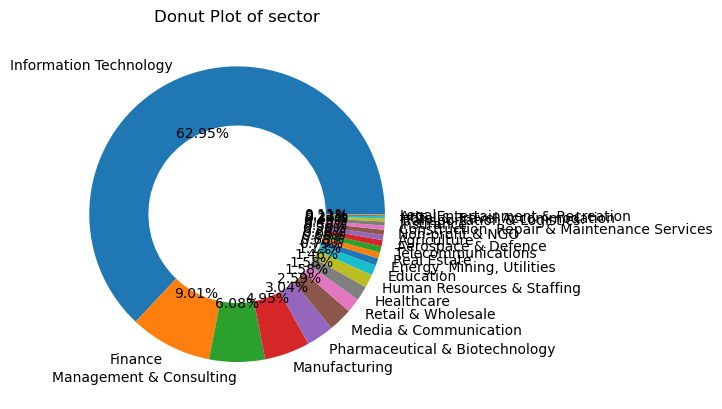

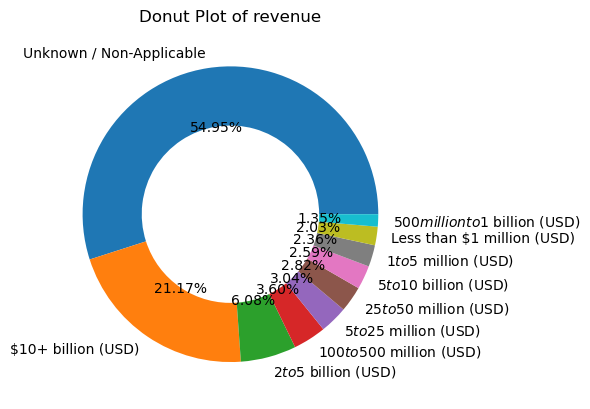

In [36]:
def donutplot_categorical_columns(data, categorical_columns):
    for column in categorical_columns:
        plt.pie(data[column].value_counts(), labels=data[column].value_counts().index,
                autopct='%0.2f%%', wedgeprops=dict(width=0.4))
        plt.title(f'Donut Plot of {column}')
        plt.show()

categorical_columns_to_plot = ['salary_estimate_payperiod', 'company_size', 'employment_type', 'sector', 'revenue']
donutplot_categorical_columns(job_data, categorical_columns_to_plot)


  Obtaining dependency information for wordcloud from https://files.pythonhosted.org/packages/39/4a/2684863905b72fceea24edaa10e3e16bc742a184042f463f3b09883d75b0/wordcloud-1.9.3-cp311-cp311-macosx_10_9_x86_64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.4/172.4 kB 2.6 MB/s eta 0:00:00 0:00:01


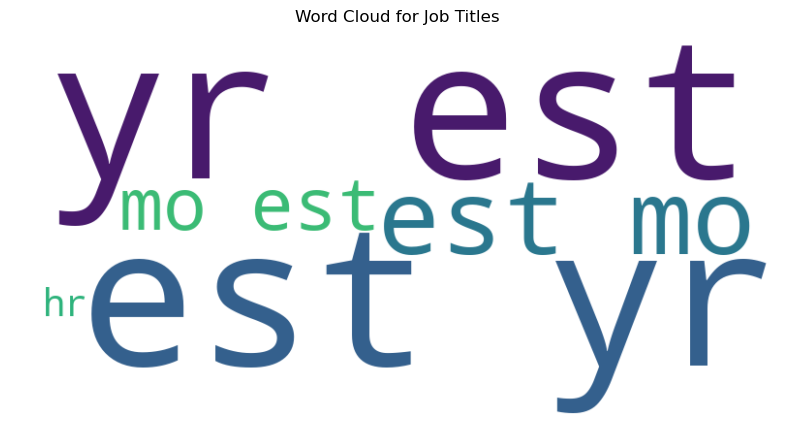

In [33]:
!pip install wordcloud

from wordcloud import WordCloud

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(job_data['salary_estimate_payperiod'].dropna()))
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Job Titles')
plt.show()


In [37]:
## Univariate Analysis for numerical Columns

['company_rating',
 'career_opportunities_rating',
 'comp_and_benefits_rating',
 'culture_and_values_rating',
 'senior_management_rating',
 'work_life_balance_rating']

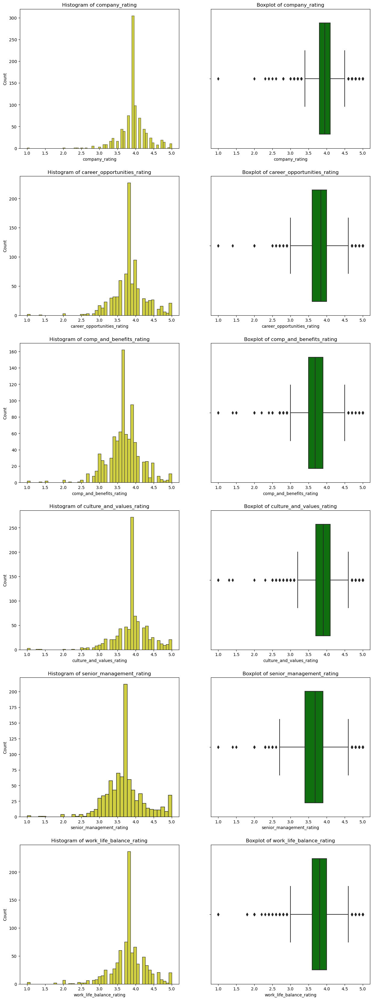

In [42]:
def plot_numerical_columns(data, numerical_columns):
    num_plots = len(numerical_columns)
    fig, axes = plt.subplots(num_plots, 2, figsize=(15, 7*num_plots))

    for i, column in enumerate(numerical_columns):
        sns.histplot(x=data[column], ax=axes[i, 0], color='y')
        axes[i, 0].set_title(f'Histogram of {column}')

        sns.boxplot(x=data[column], ax=axes[i, 1], color='g')
        axes[i, 1].set_title(f'Boxplot of {column}')

    plt.show()

numerical_columns_to_plot = ['company_rating',
 'career_opportunities_rating',
 'comp_and_benefits_rating',
 'culture_and_values_rating',
 'senior_management_rating',
 'work_life_balance_rating']
plot_numerical_columns(job_data, numerical_columns_to_plot)


In [ ]:
## outlier treatment for numerical values

In [81]:


job_data.loc[(job_data['company_rating'] > 4.5) | (job_data['company_rating'] < 3.4), 'company_rating'] = job_data['company_rating'].median()
job_data.loc[(job_data['career_opportunities_rating'] > 4.5) | (job_data['career_opportunities_rating'] < 3), 'career_opportunities_rating'] = job_data['career_opportunities_rating'].median()
job_data.loc[(job_data['comp_and_benefits_rating'] > 4.5) | (job_data['comp_and_benefits_rating'] < 3), 'comp_and_benefits_rating'] = job_data['comp_and_benefits_rating'].median()
job_data.loc[(job_data['culture_and_values_rating'] > 4.5) | (job_data['culture_and_values_rating'] < 3.4), 'culture_and_values_rating'] = job_data['culture_and_values_rating'].median()
job_data.loc[(job_data['senior_management_rating'] > 4.5) | (job_data['senior_management_rating'] < 3), 'senior_management_rating'] = job_data['senior_management_rating'].median()
job_data.loc[(job_data['work_life_balance_rating'] > 4.5) | (job_data['work_life_balance_rating'] < 3), 'work_life_balance_rating'] = job_data['work_life_balance_rating'].median()


In [ ]:
## lets check the data again

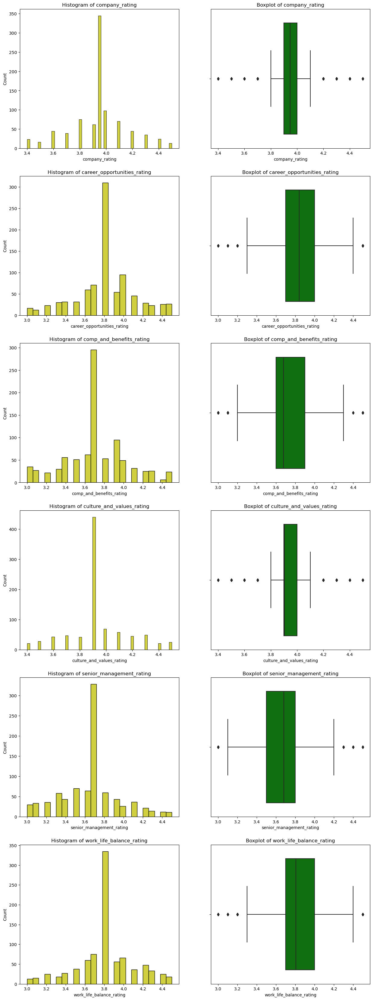

In [82]:
def plot_numerical_columns(data, numerical_columns):
    num_plots = len(numerical_columns)
    fig, axes = plt.subplots(num_plots, 2, figsize=(15, 7*num_plots))

    for i, column in enumerate(numerical_columns):
        sns.histplot(x=data[column], ax=axes[i, 0], color='y')
        axes[i, 0].set_title(f'Histogram of {column}')

        sns.boxplot(x=data[column], ax=axes[i, 1], color='g')
        axes[i, 1].set_title(f'Boxplot of {column}')

    plt.show()

numerical_columns_to_plot = ['company_rating',
 'career_opportunities_rating',
 'comp_and_benefits_rating',
 'culture_and_values_rating',
 'senior_management_rating',
 'work_life_balance_rating']
plot_numerical_columns(job_data, numerical_columns_to_plot)


In [ ]:
## for categorical values treated as numerical values different charts are required to visualise the data

In [ ]:
## tree map for large categorical values

['company',
 'job_title',
 'location',
 'salary_avg_estimate',
 'company_founded',
 'industry']
 

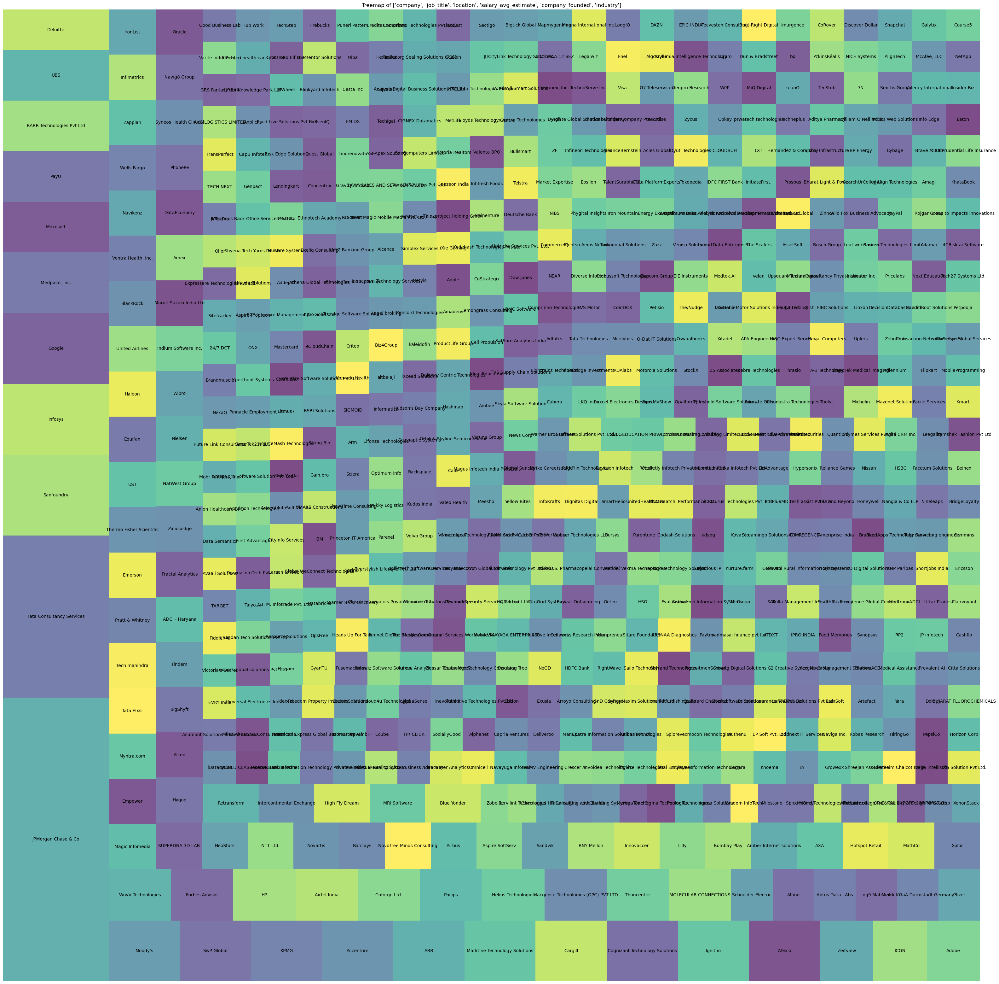

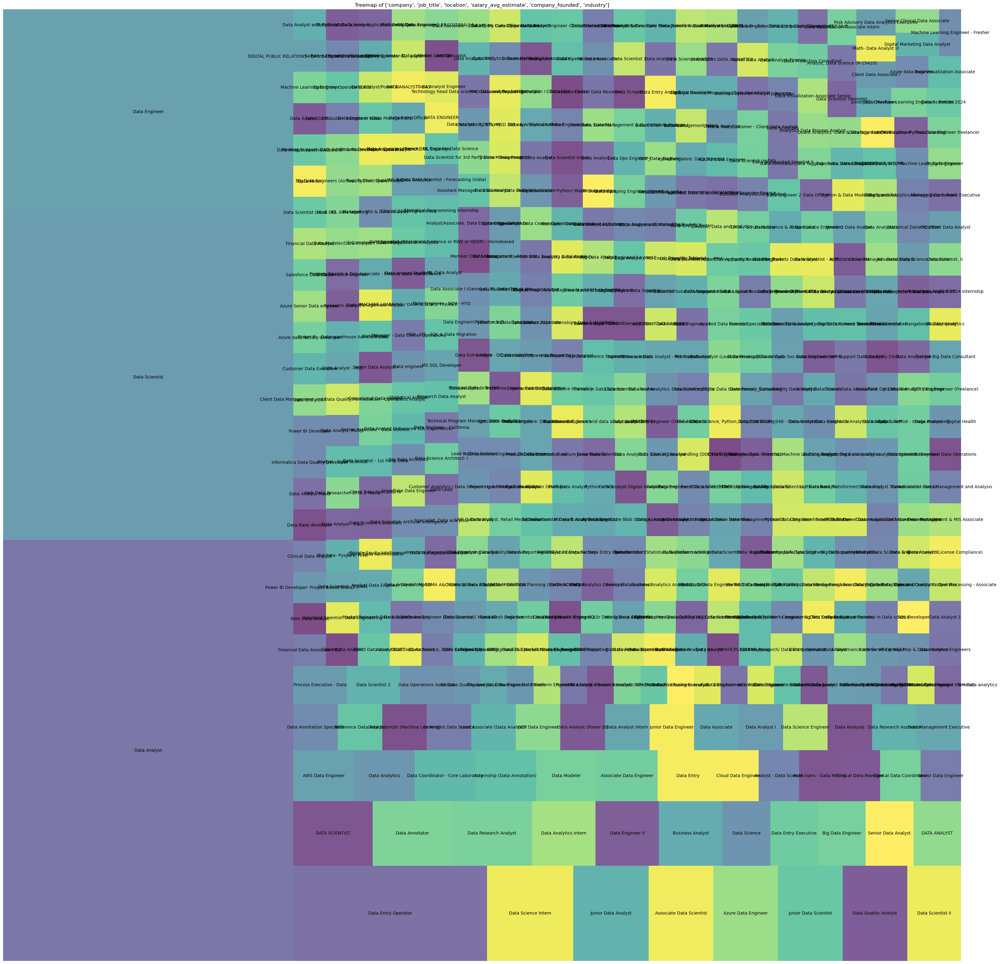

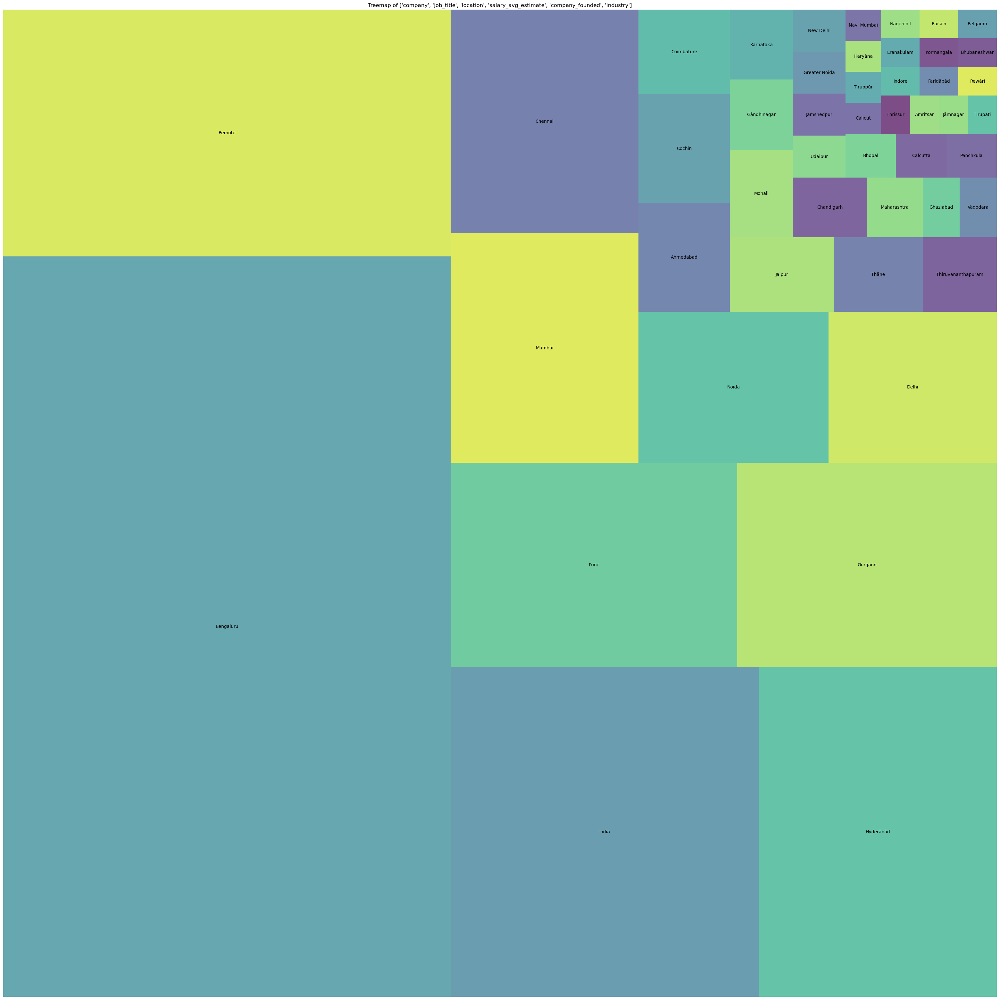

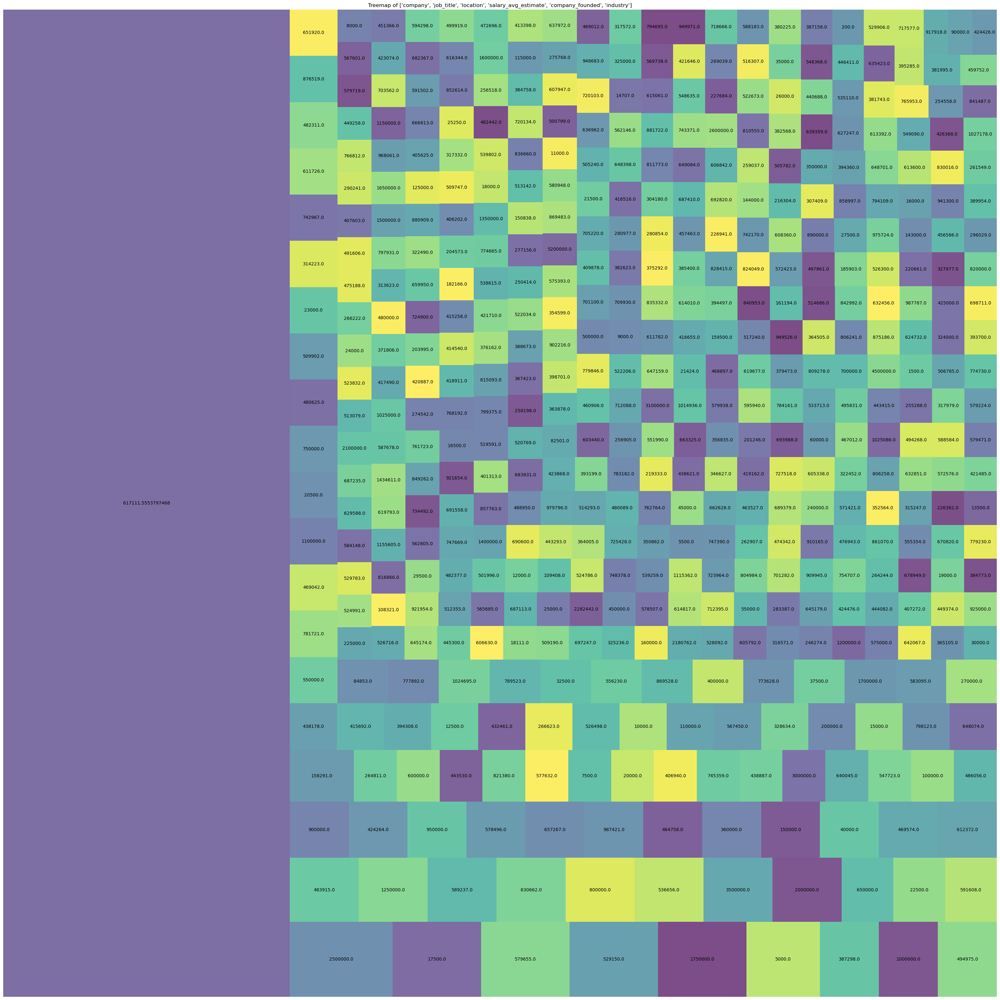

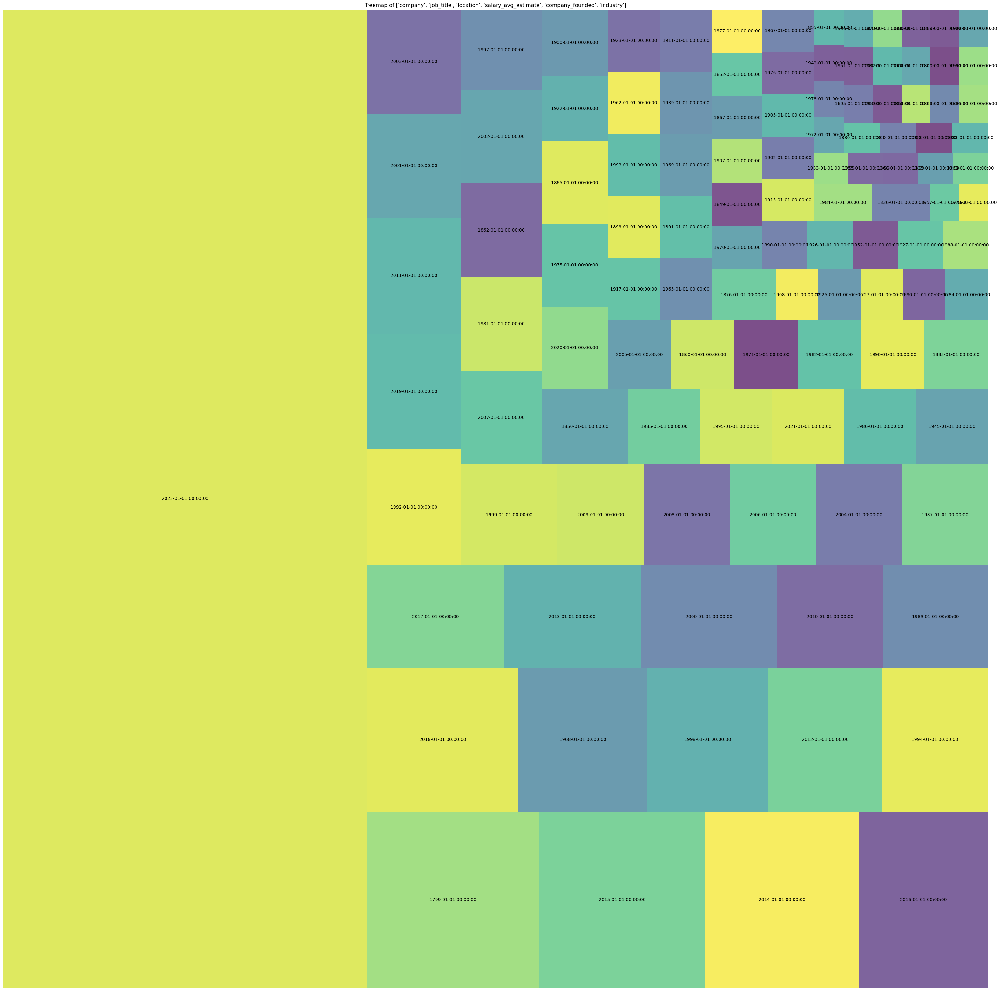

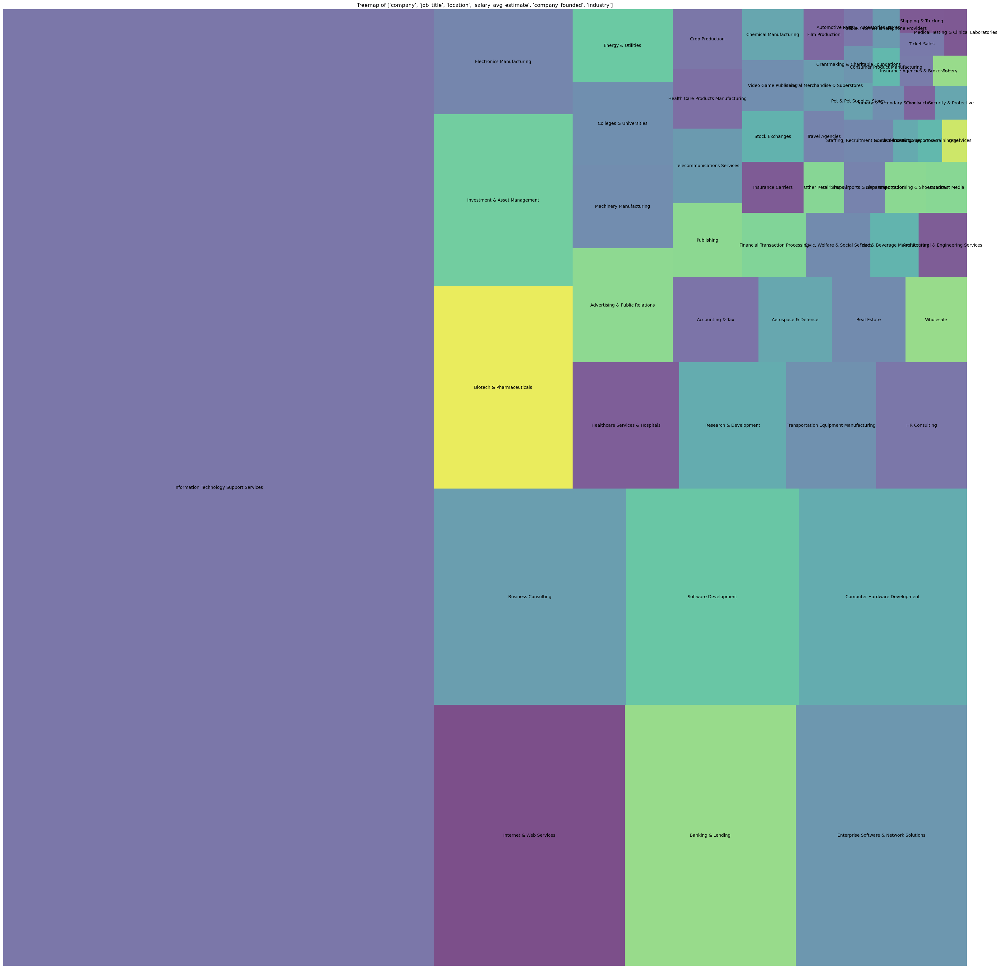

In [77]:
import squarify
catnumvalue=['company',
 'job_title',
 'location',
 'salary_avg_estimate',
 'company_founded',
 'industry']
for i in catnumvalue:
    plt.figure(figsize=(40, 40))
    squarify.plot(job_data[i].value_counts(), label=job_data[i].value_counts().index, alpha=0.7)
    plt.axis('off')
    plt.title(f'Treemap of {catnumvalue}')
    plt.show()


In [ ]:
## top-n bar chart

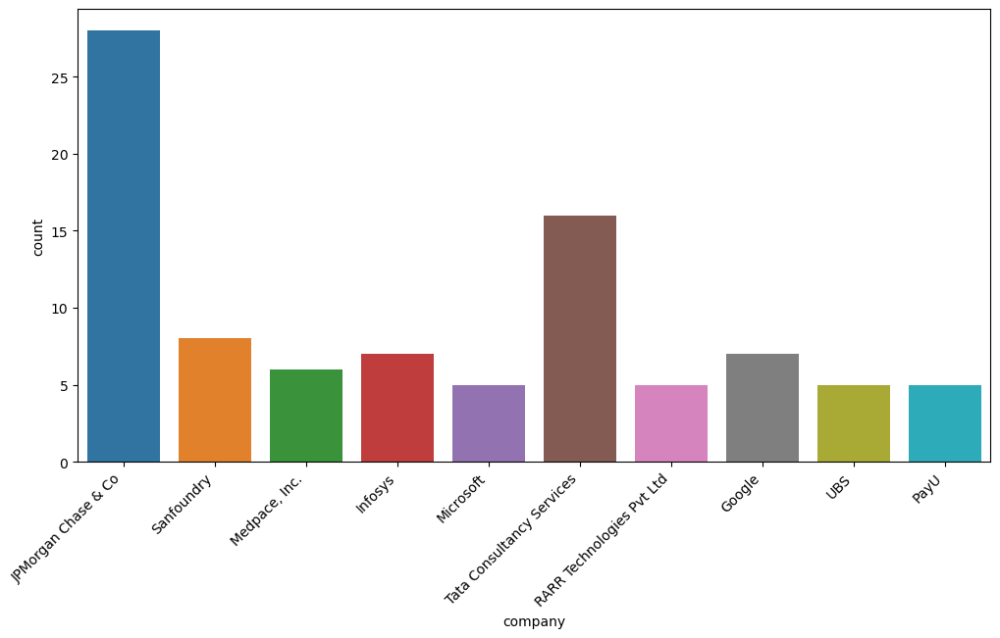

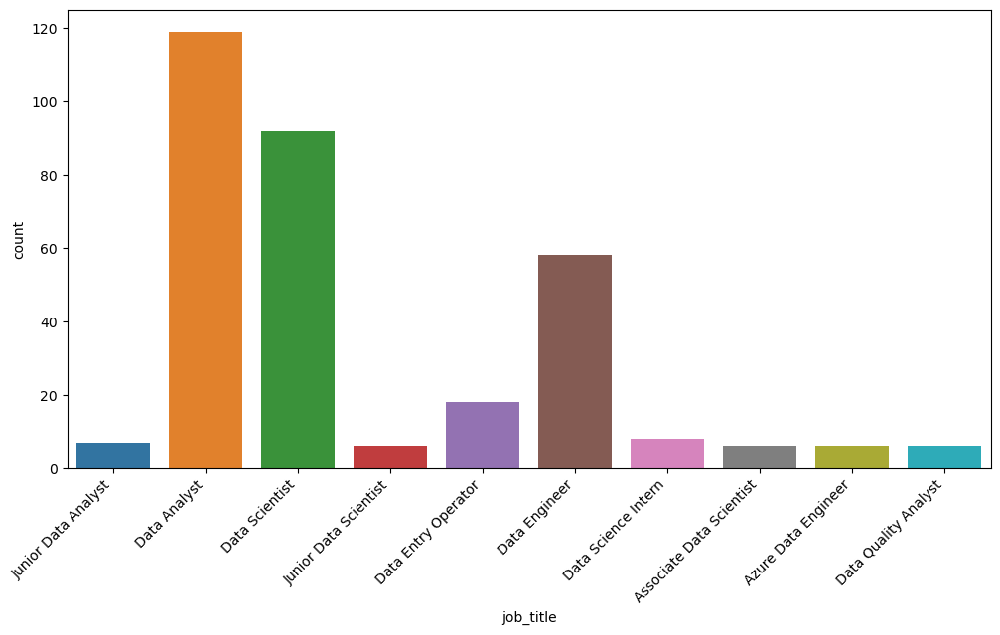

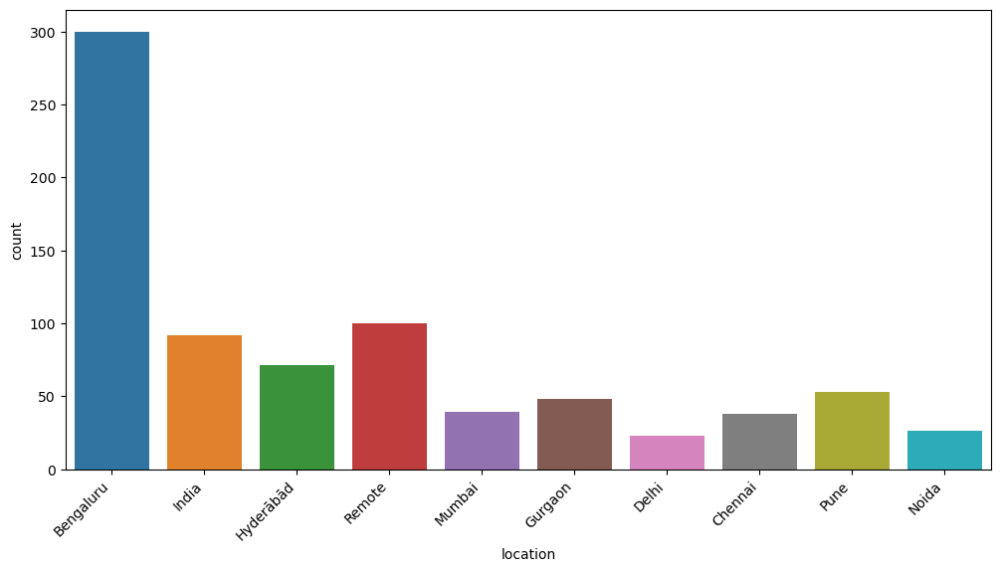

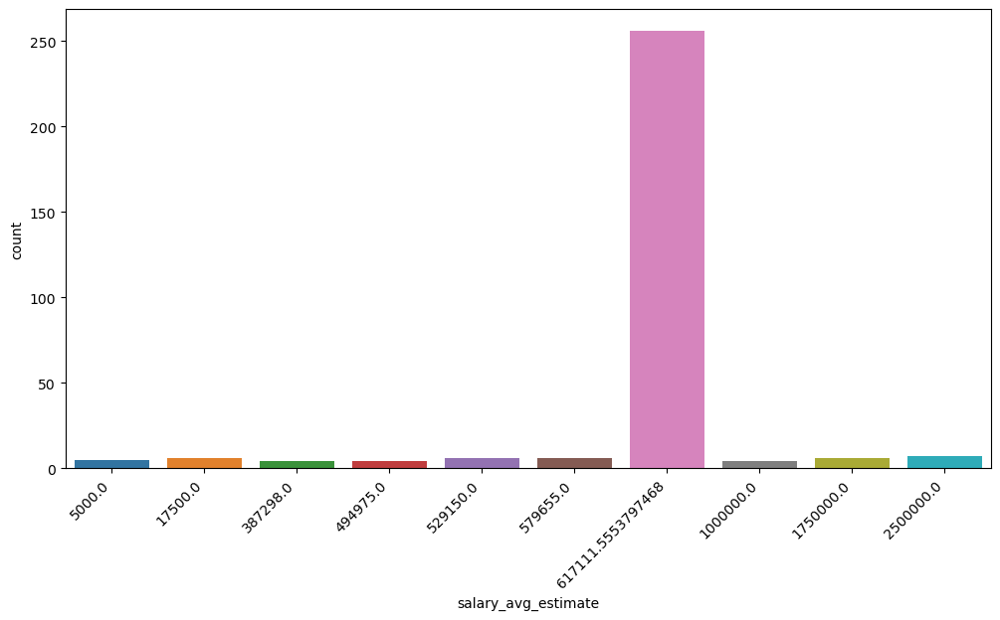

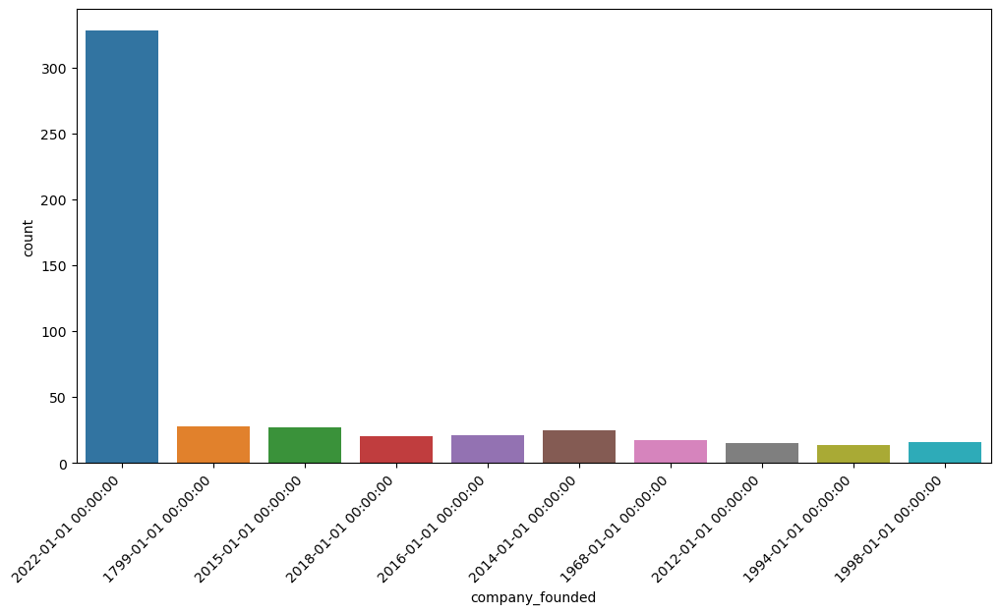

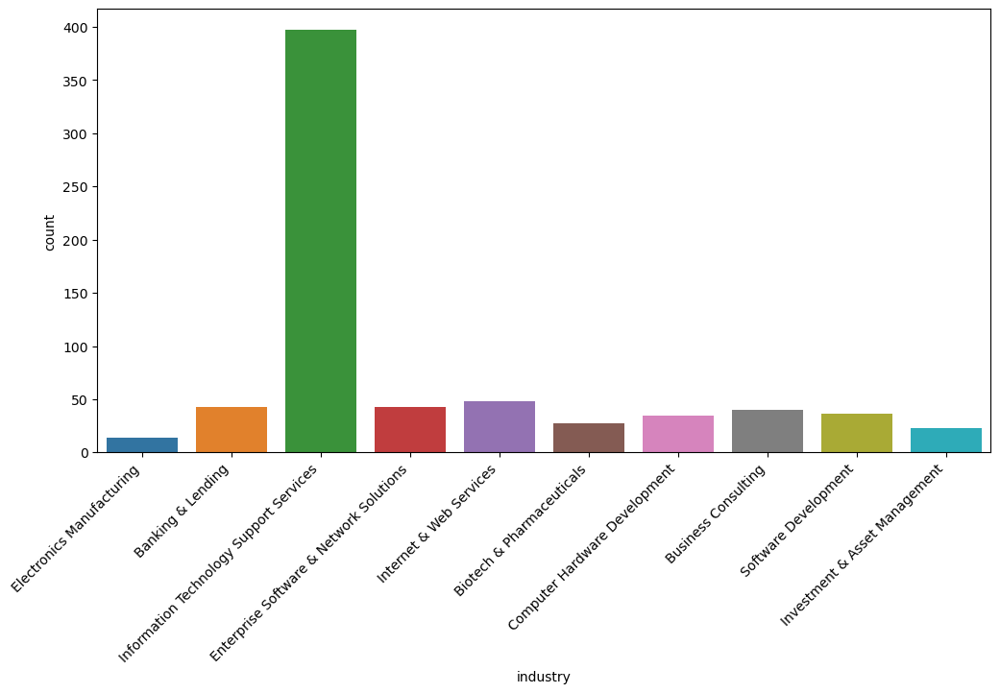

In [78]:
import seaborn as sns
import matplotlib.pyplot as plt
catnumvalue=['company',
 'job_title',
 'location',
 'salary_avg_estimate',
 'company_founded',
 'industry']
for i in catnumvalue:
    top_n = 10  
    top_categories = job_data[i].value_counts().nlargest(top_n).index

    plt.figure(figsize=(12, 6))
    sns.countplot(x=i, data=job_data[job_data[i].isin(top_categories)])
    plt.xticks(rotation=45, ha='right')
    plt.show()



In [ ]:
## wordcloud

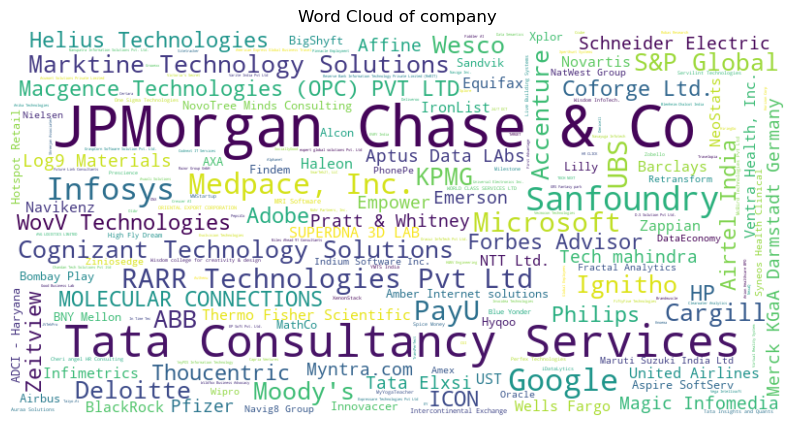

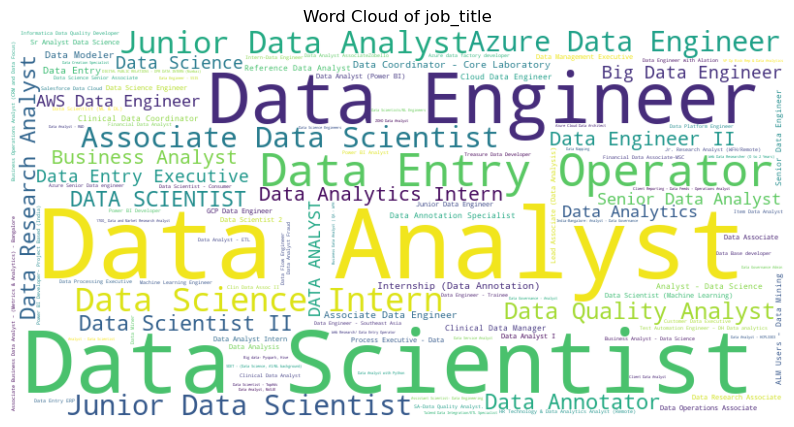

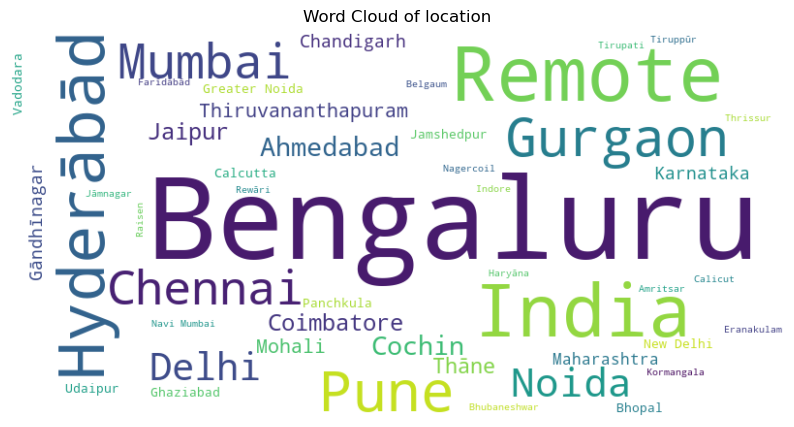

TypeError: argument of type 'float' is not iterable

<Figure size 1000x800 with 0 Axes>

In [79]:
from wordcloud import WordCloud
catnumvalue=['company',
 'job_title',
 'location',
 'salary_avg_estimate',
 'company_founded',
 'industry']
for i in catnumvalue:
    plt.figure(figsize=(10, 8))
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(job_data[i].value_counts())
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud of {i}')
    plt.show()

In [57]:
## interactive visualization

In [60]:
import plotly.express as px

top_n = 10
top_categories = job_data['company'].value_counts().nlargest(top_n).reset_index()

fig = px.bar(top_categories, x='index', y='company',
             labels={'index': 'Company', 'company': 'Count'},
             title='Top Companies')
fig.show()


ValueError: Value of 'x' is not the name of a column in 'data_frame'. Expected one of ['company', 'count'] but received: index
 To use the index, pass it in directly as `df.index`.

In [83]:
# level 2 analysis

For level 2 analysis we will use the company rating column to compare it with all the other attributed of the data

For this very purpose we will divide the company ratings to high rating and low rating

In [95]:
import statistics

mean_company_rating = job_data['company_rating'].mean()
median_company_rating = job_data['company_rating'].median()
mode_company_rating = statistics.mode(job_data['company_rating'])

print(f"Mean Company Rating: {mean_company_rating:.2f}")
print(f"Median Company Rating: {median_company_rating:.2f}")
print(f"Mode Company Rating: {mode_company_rating:.2f}")


Mean Company Rating: 3.95
Median Company Rating: 3.95
Mode Company Rating: 3.95


In [109]:
import pandas as pd

# Assuming a threshold of 4.0 as the cutoff for high and low ratings
rating_threshold = 3.95

# Create a new categorical column
job_data['rating_category'] = pd.cut(job_data['company_rating'], bins=[-float('inf'), rating_threshold, float('inf')],
                                     labels=['Low Rating', 'High Rating'])

job_data[['company_rating', 'rating_category']].head()


/var/folders/97/r06tw6zs1pgcx5z2qp9mf0q00000gn/T/ipykernel_3853/1759177852.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  job_data['rating_category'] = pd.cut(job_data['company_rating'], bins=[-float('inf'), rating_threshold, float('inf')],


,company_rating,rating_category
0,4.000000,High Rating
1,4.000000,High Rating
2,3.900000,Low Rating
3,3.946512,Low Rating
4,4.000000,High Rating


In [ ]:
## CAT CAT Analysis

In [111]:
job_data

,company,job_title,company_rating,job_description,location,salary_avg_estimate,salary_estimate_payperiod,company_size,company_founded,employment_type,industry,sector,revenue,career_opportunities_rating,comp_and_benefits_rating,culture_and_values_rating,senior_management_rating,work_life_balance_rating,rating_category
0,ABB,Junior Data Analyst,4.000000,Junior Data Analyst\nTake your next career ste...,Bengaluru,325236.00000,/yr (est.),10000+ Employees,1883-01-01,Company - Public,Electronics Manufacturing,Manufacturing,$10+ billion (USD),3.700000,3.600000,4.000000,3.500000,3.900000,High Rating
1,Philips,Data Scientist - AI/ML,4.000000,Job Title\nData Scientist - AI/ML\nJob Descrip...,Bengaluru,617111.55538,/yr (est.),10000+ Employees,1891-01-01,Company - Public,Healthcare Services & Hospitals,Healthcare,$10+ billion (USD),3.800000,3.700000,4.000000,3.500000,4.000000,High Rating
2,HSBC,Data Science GSC’s,3.900000,Job description\nGraduate/ Post-graduate degre...,Bengaluru,617111.55538,/yr (est.),10000+ Employees,1865-01-01,Company - Public,Banking & Lending,Finance,$10+ billion (USD),3.600000,3.600000,3.800000,3.400000,3.700000,Low Rating
3,Facctum Solutions,Data Analyst,3.946512,Job Description\nExperience: 0 - 2 years in da...,Karnataka,617111.55538,/yr (est.),1 to 50 Employees,2022-01-01,Company - Private,Information Technology Support Services,Information Technology,Unknown / Non-Applicable,3.839669,3.678926,3.903581,3.679477,3.804683,Low Rating
4,JPMorgan Chase & Co,Data and Analytics - Associate,4.000000,JOB DESCRIPTION\n\nYou are a strategic thinker...,India,617111.55538,/yr (est.),10000+ Employees,1799-01-01,Company - Public,Banking & Lending,Finance,$10+ billion (USD),4.000000,3.900000,3.900000,3.600000,3.700000,High Rating
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
895,Kpro Solutions,Analytics & Data Science,4.000000,Experience & Qualification:\n\nMinimum of 9 ye...,Bengaluru,483915.00000,/yr (est.),1 to 50 Employees,2022-01-01,Company - Private,Information Technology Support Services,Information Technology,Unknown / Non-Applicable,4.000000,4.000000,4.000000,4.000000,4.000000,High Rating
896,Athena Global Technologies,Data Engineer,3.946512,Immediate requirement for Data Engineer\nExper...,Hyderābād,678949.00000,/yr (est.),51 to 200 Employees,2022-01-01,Company - Private,Information Technology Support Services,Information Technology,Unknown / Non-Applicable,4.200000,3.500000,4.000000,3.900000,3.900000,Low Rating
897,Wesco,India-Bangalore: Data Engineer,3.700000,This person will work independently or with a ...,Bengaluru,651920.00000,/yr (est.),10000+ Employees,1922-01-01,Company - Public,Wholesale,Retail & Wholesale,$10+ billion (USD),3.500000,3.400000,3.600000,3.300000,3.800000,Low Rating
898,Course5,Data Scientist,4.200000,If you meet our position requirements and can ...,Bengaluru,424426.00000,/yr (est.),1001 to 5000 Employees,2000-01-01,Company - Private,Business Consulting,Management & Consulting,$100 to $500 million (USD),4.300000,4.100000,4.300000,4.100000,4.200000,High Rating


In [88]:
### rating category vs location


In [112]:
import pandas as pd
rating_category_info=pd.crosstab(job_data['rating_category'],job_data['location'])
rating_category_info

location,Ahmedabad,Amritsar,Belgaum,Bengaluru,Bhopal,Bhubaneshwar,Calcutta,Calicut,Chandigarh,Chennai,...,Raisen,Remote,Rewāri,Thiruvananthapuram,Thrissur,Thāne,Tirupati,Tiruppūr,Udaipur,Vadodara
rating_category,,,,,,,,,,,,,,,,,,,,,
Low Rating,7,1,1,178,2,1,2,1,2,29,...,1,82,1,5,0,6,0,1,0,1
High Rating,2,0,0,122,0,0,0,0,2,9,...,0,18,0,0,1,0,1,0,2,1


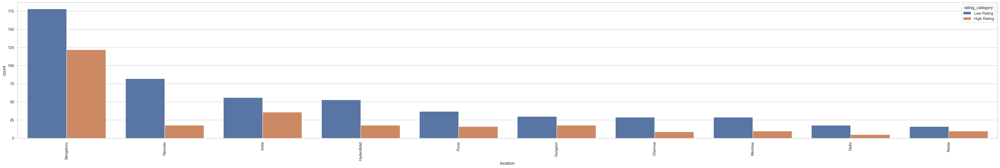

In [119]:
import seaborn as sns
import matplotlib.pyplot as plt

location_counts = job_data.groupby(['rating_category', 'location']).size().reset_index(name='count')

top_10_high_rated = location_counts.groupby('rating_category').apply(lambda x: x.nlargest(10, 'count')).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(50, 7))
sns.barplot(x='location', y='count', hue='rating_category', data=top_10_high_rated, ax=ax)
plt.xticks(rotation=90)
plt.show()


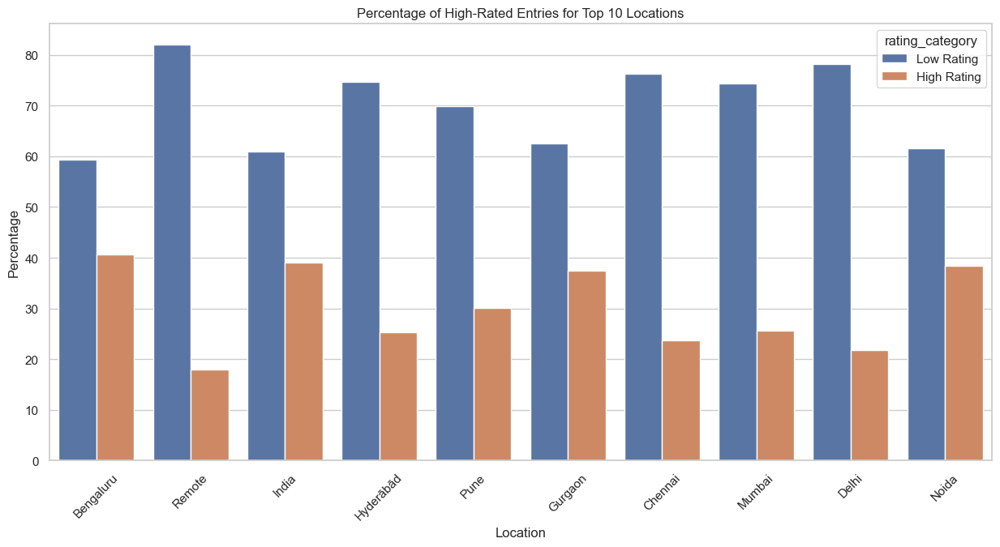

In [120]:
import seaborn as sns
import matplotlib.pyplot as plt

location_counts = job_data.groupby(['rating_category', 'location']).size().reset_index(name='count')

top_10_high_rated = location_counts.groupby('rating_category').apply(lambda x: x.nlargest(10, 'count')).reset_index(drop=True)

top_10_high_rated['percentage_high_rated'] = (
    top_10_high_rated.groupby('location')['count'].transform(lambda x: x / x.sum())
) * 100

fig, ax = plt.subplots(figsize=(15, 7))
sns.barplot(x='location', y='percentage_high_rated', hue='rating_category', data=top_10_high_rated, ax=ax)
plt.title('Percentage of High-Rated Entries for Top 10 Locations')
plt.xlabel('Location')
plt.ylabel('Percentage')
plt.xticks(rotation=45)
plt.show()


In [121]:
## rating category vs job_title

In [122]:
import pandas as pd
rating_category_info=pd.crosstab(job_data['rating_category'],job_data['job_title'])
rating_category_info

job_title,1700_ Data and Market Research Analyst,448395/Azure Data Factory,AI Data Scientist,AI-ML Data Analyst,AI/ML Developer - Data Scientist,ALM Users - Data Mining,ASSISTANT DATA ANALYST,AWS Data Engineer,AZURE Data Engineer,Advanced Data Science Associate,...,Test Automation Engineer – DH Data analytics,Trainee - Data Research,Trainee - Data Scientist,Trainee Big Data Consultant,Trainee in Data Science,Treasure Data Developer,VP Op Risk Rep & Data Analytics,Web Data Researcher (0 to 2 Years),Web Research/ Data Entry Operator,ZOHO Data Analyst
rating_category,,,,,,,,,,,,,,,,,,,,,
Low Rating,1,1,0,1,1,2,1,2,1,1,...,1,1,1,1,1,1,0,1,0,1
High Rating,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,1,0


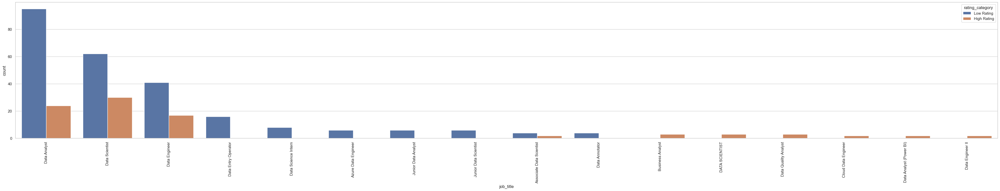

In [123]:
import seaborn as sns
import matplotlib.pyplot as plt

location_counts = job_data.groupby(['rating_category', 'job_title']).size().reset_index(name='count')

top_10_high_rated = location_counts.groupby('rating_category').apply(lambda x: x.nlargest(10, 'count')).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(50, 7))
sns.barplot(x='job_title', y='count', hue='rating_category', data=top_10_high_rated, ax=ax)
plt.xticks(rotation=90)
plt.show()

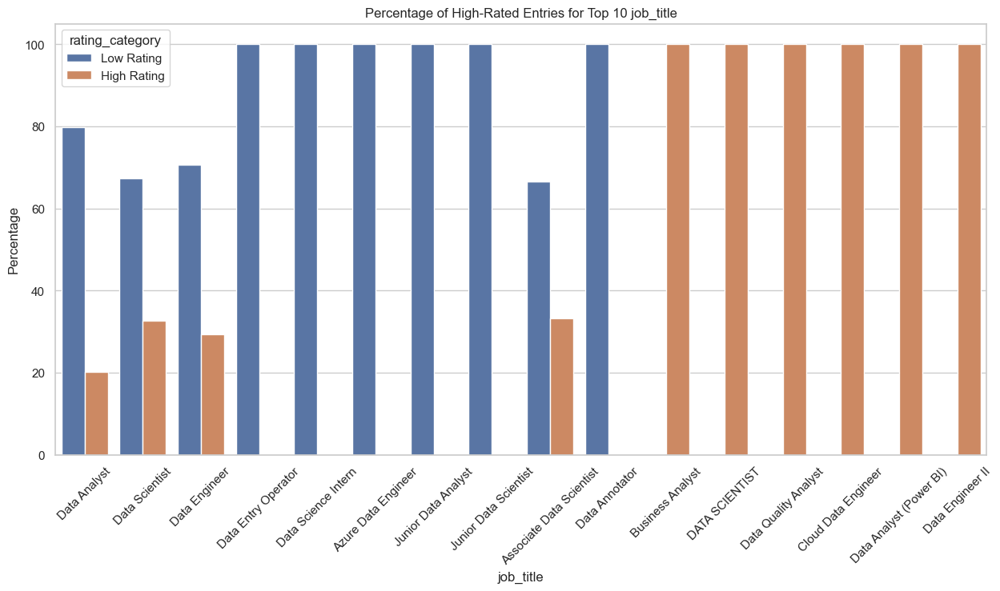

In [124]:
import seaborn as sns
import matplotlib.pyplot as plt

location_counts = job_data.groupby(['rating_category', 'job_title']).size().reset_index(name='count')

top_10_high_rated = location_counts.groupby('rating_category').apply(lambda x: x.nlargest(10, 'count')).reset_index(drop=True)

top_10_high_rated['percentage_high_rated'] = (
    top_10_high_rated.groupby('job_title')['count'].transform(lambda x: x / x.sum())
) * 100

fig, ax = plt.subplots(figsize=(15, 7))
sns.barplot(x='job_title', y='percentage_high_rated', hue='rating_category', data=top_10_high_rated, ax=ax)
plt.title('Percentage of High-Rated Entries for Top 10 job_title')
plt.xlabel('job_title')
plt.ylabel('Percentage')
plt.xticks(rotation=45)
plt.show()


In [125]:
## rating category vs company

In [126]:
import pandas as pd
rating_category_info=pd.crosstab(job_data['rating_category'],job_data['company'])
rating_category_info

company,1myPOS Information Technology,24/7 DCT,4CRisk.ai Software,7N,A-1 Technology,ABB,ADCI - Haryana,ADCI - Haryana - D50,ADCI - Uttar Pradesh,ADCI MAA 12 SEZ,...,iXie Gaming,kaleidofin,nurture.farm,orchid furnishings llp,padmasai finance pvt ltd,prwatech technologies,scanO,smartData Enterprises,vMD tech assist Pvt LTD,velan
rating_category,,,,,,,,,,,,,,,,,,,,,
Low Rating,1,1,0,1,1,0,2,1,1,1,...,0,1,1,1,1,1,1,1,1,1
High Rating,0,0,1,0,0,4,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


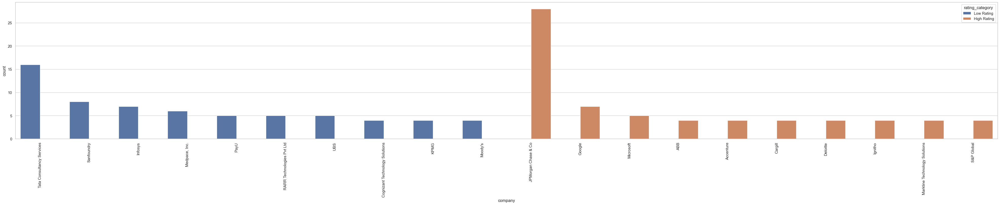

In [127]:
import seaborn as sns
import matplotlib.pyplot as plt

location_counts = job_data.groupby(['rating_category', 'company']).size().reset_index(name='count')

top_10_high_rated = location_counts.groupby('rating_category').apply(lambda x: x.nlargest(10, 'count')).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(50, 7))
sns.barplot(x='company', y='count', hue='rating_category', data=top_10_high_rated, ax=ax)
plt.xticks(rotation=90)
plt.show()

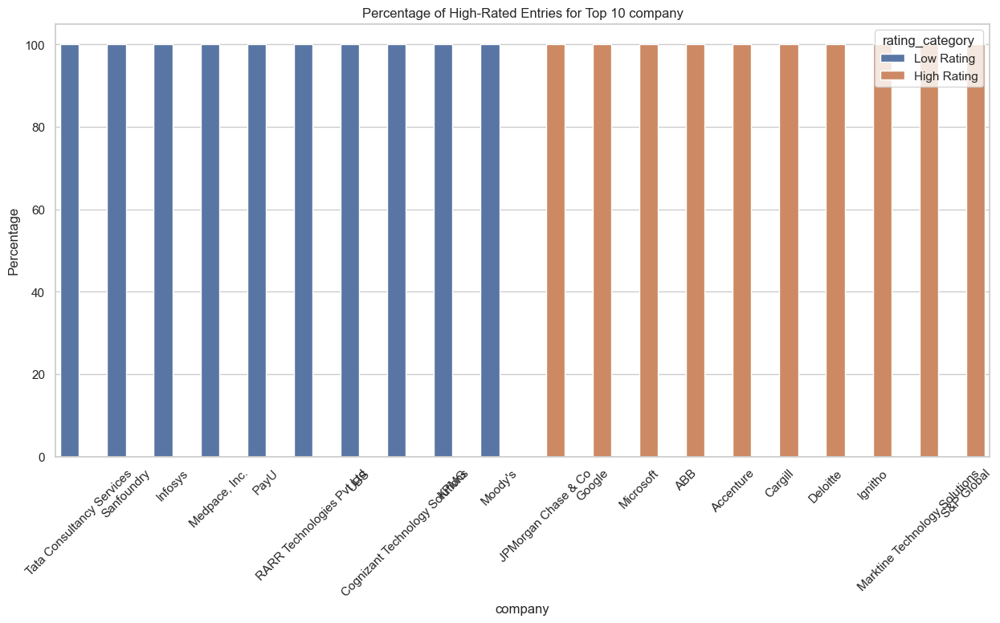

In [128]:
import seaborn as sns
import matplotlib.pyplot as plt

location_counts = job_data.groupby(['rating_category', 'company']).size().reset_index(name='count')

top_10_high_rated = location_counts.groupby('rating_category').apply(lambda x: x.nlargest(10, 'count')).reset_index(drop=True)

top_10_high_rated['percentage_high_rated'] = (
    top_10_high_rated.groupby('company')['count'].transform(lambda x: x / x.sum())
) * 100

fig, ax = plt.subplots(figsize=(15, 7))
sns.barplot(x='company', y='percentage_high_rated', hue='rating_category', data=top_10_high_rated, ax=ax)
plt.title('Percentage of High-Rated Entries for Top 10 company')
plt.xlabel('company')
plt.ylabel('Percentage')
plt.xticks(rotation=45)
plt.show()

In [129]:
## vs salary_estd_payperiod

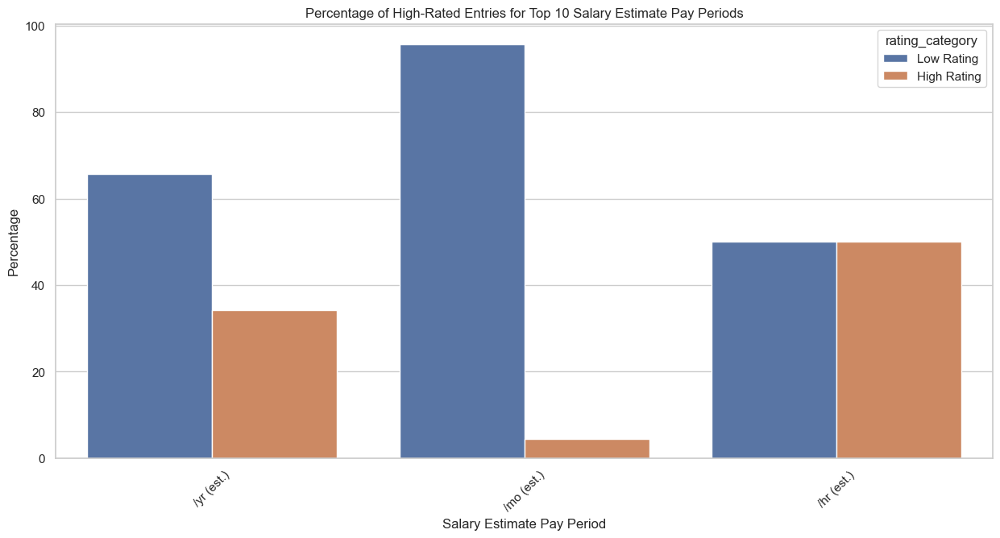

In [130]:
import seaborn as sns
import matplotlib.pyplot as plt

salary_estimate_counts = job_data.groupby(['rating_category', 'salary_estimate_payperiod']).size().reset_index(name='count')

top_10_high_rated_salary = salary_estimate_counts.groupby('rating_category').apply(lambda x: x.nlargest(10, 'count')).reset_index(drop=True)

top_10_high_rated_salary['percentage_high_rated'] = (
    top_10_high_rated_salary.groupby('salary_estimate_payperiod')['count'].transform(lambda x: x / x.sum())
) * 100

fig, ax = plt.subplots(figsize=(15, 7))
sns.barplot(x='salary_estimate_payperiod', y='percentage_high_rated', hue='rating_category', data=top_10_high_rated_salary, ax=ax)
plt.title('Percentage of High-Rated Entries for Top 10 Salary Estimate Pay Periods')
plt.xlabel('Salary Estimate Pay Period')
plt.ylabel('Percentage')
plt.xticks(rotation=45)
plt.show()


In [131]:
## vs company size

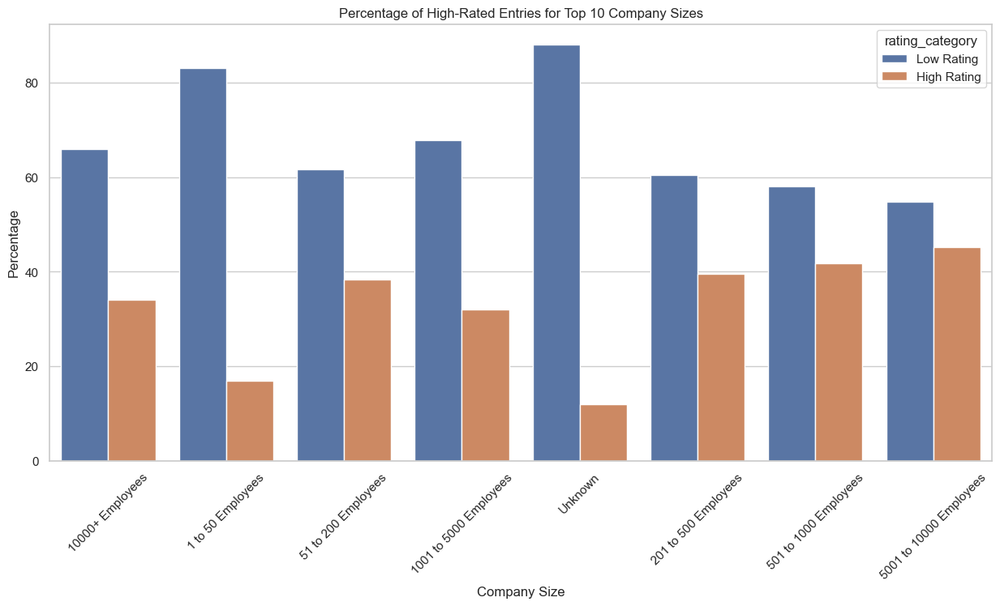

In [132]:
import seaborn as sns
import matplotlib.pyplot as plt

company_size_counts = job_data.groupby(['rating_category', 'company_size']).size().reset_index(name='count')

top_10_high_rated_size = company_size_counts.groupby('rating_category').apply(lambda x: x.nlargest(10, 'count')).reset_index(drop=True)

top_10_high_rated_size['percentage_high_rated'] = (
    top_10_high_rated_size.groupby('company_size')['count'].transform(lambda x: x / x.sum())
) * 100

fig, ax = plt.subplots(figsize=(15, 7))
sns.barplot(x='company_size', y='percentage_high_rated', hue='rating_category', data=top_10_high_rated_size, ax=ax)
plt.title('Percentage of High-Rated Entries for Top 10 Company Sizes')
plt.xlabel('Company Size')
plt.ylabel('Percentage')
plt.xticks(rotation=45)
plt.show()


In [133]:
## vs employment type

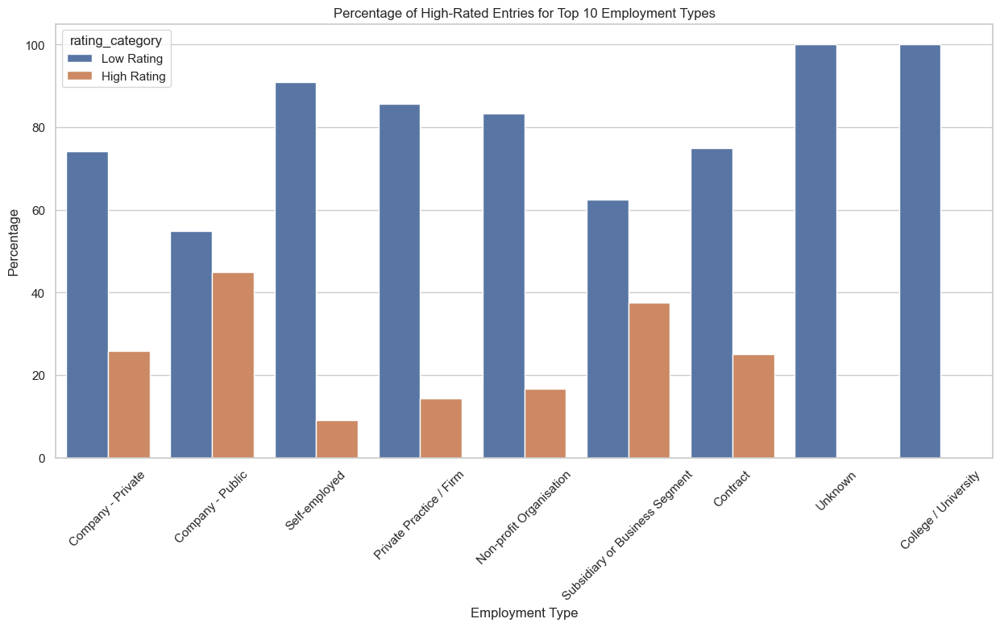

In [134]:
import seaborn as sns
import matplotlib.pyplot as plt

employment_type_counts = job_data.groupby(['rating_category', 'employment_type']).size().reset_index(name='count')

top_10_high_rated_employment = employment_type_counts.groupby('rating_category').apply(lambda x: x.nlargest(10, 'count')).reset_index(drop=True)

top_10_high_rated_employment['percentage_high_rated'] = (
    top_10_high_rated_employment.groupby('employment_type')['count'].transform(lambda x: x / x.sum())
) * 100

fig, ax = plt.subplots(figsize=(15, 7))
sns.barplot(x='employment_type', y='percentage_high_rated', hue='rating_category', data=top_10_high_rated_employment, ax=ax)
plt.title('Percentage of High-Rated Entries for Top 10 Employment Types')
plt.xlabel('Employment Type')
plt.ylabel('Percentage')
plt.xticks(rotation=45)
plt.show()


In [135]:
## vs industry

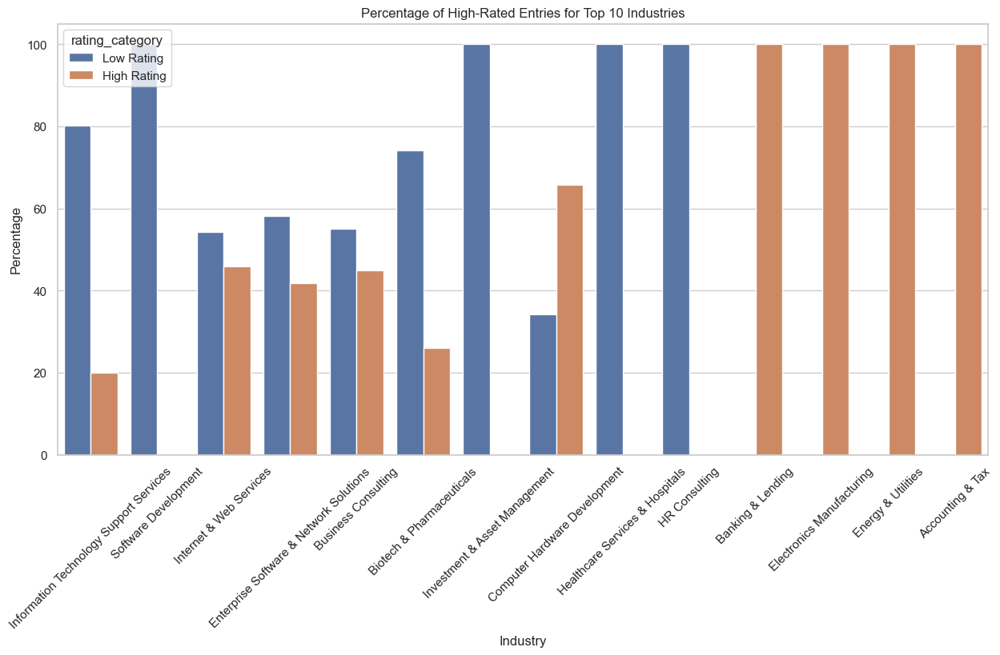

In [136]:
import seaborn as sns
import matplotlib.pyplot as plt

industry_counts = job_data.groupby(['rating_category', 'industry']).size().reset_index(name='count')

top_10_high_rated_industry = industry_counts.groupby('rating_category').apply(lambda x: x.nlargest(10, 'count')).reset_index(drop=True)

top_10_high_rated_industry['percentage_high_rated'] = (
    top_10_high_rated_industry.groupby('industry')['count'].transform(lambda x: x / x.sum())
) * 100

fig, ax = plt.subplots(figsize=(15, 7))
sns.barplot(x='industry', y='percentage_high_rated', hue='rating_category', data=top_10_high_rated_industry, ax=ax)
plt.title('Percentage of High-Rated Entries for Top 10 Industries')
plt.xlabel('Industry')
plt.ylabel('Percentage')
plt.xticks(rotation=45)
plt.show()


In [137]:
## vs sector

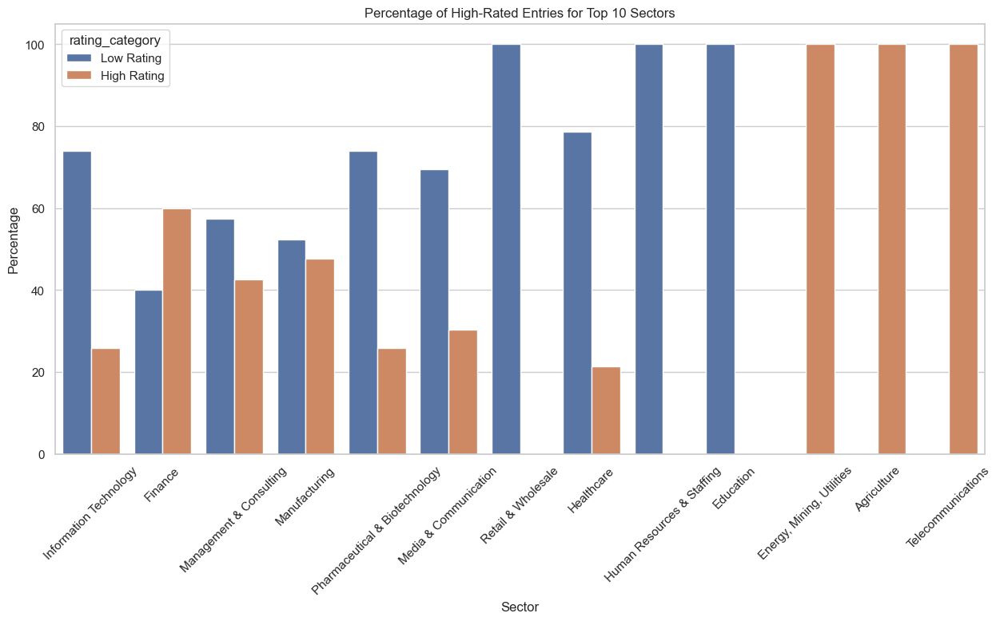

In [138]:
import seaborn as sns
import matplotlib.pyplot as plt

sector_counts = job_data.groupby(['rating_category', 'sector']).size().reset_index(name='count')

top_10_high_rated_sector = sector_counts.groupby('rating_category').apply(lambda x: x.nlargest(10, 'count')).reset_index(drop=True)

top_10_high_rated_sector['percentage_high_rated'] = (
    top_10_high_rated_sector.groupby('sector')['count'].transform(lambda x: x / x.sum())
) * 100

fig, ax = plt.subplots(figsize=(15, 7))
sns.barplot(x='sector', y='percentage_high_rated', hue='rating_category', data=top_10_high_rated_sector, ax=ax)
plt.title('Percentage of High-Rated Entries for Top 10 Sectors')
plt.xlabel('Sector')
plt.ylabel('Percentage')
plt.xticks(rotation=45)
plt.show()


In [139]:
## vs revenue

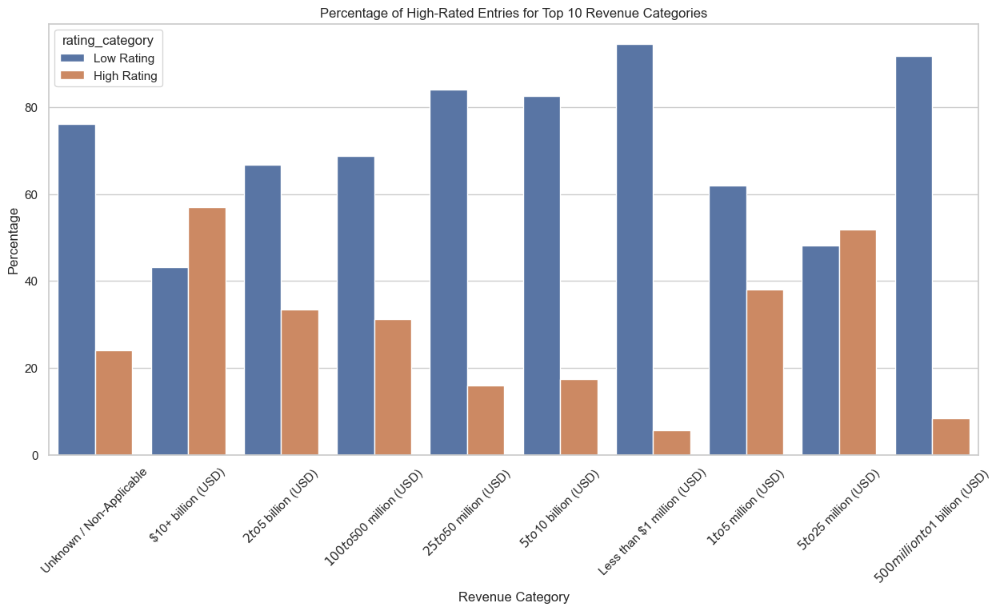

In [140]:
import seaborn as sns
import matplotlib.pyplot as plt

revenue_counts = job_data.groupby(['rating_category', 'revenue']).size().reset_index(name='count')

top_10_high_rated_revenue = revenue_counts.groupby('rating_category').apply(lambda x: x.nlargest(10, 'count')).reset_index(drop=True)

top_10_high_rated_revenue['percentage_high_rated'] = (
    top_10_high_rated_revenue.groupby('revenue')['count'].transform(lambda x: x / x.sum())
) * 100

fig, ax = plt.subplots(figsize=(15, 7))
sns.barplot(x='revenue', y='percentage_high_rated', hue='rating_category', data=top_10_high_rated_revenue, ax=ax)
plt.title('Percentage of High-Rated Entries for Top 10 Revenue Categories')
plt.xlabel('Revenue Category')
plt.ylabel('Percentage')
plt.xticks(rotation=45)
plt.show()


In [141]:
## CAT NUM ANALYSIS

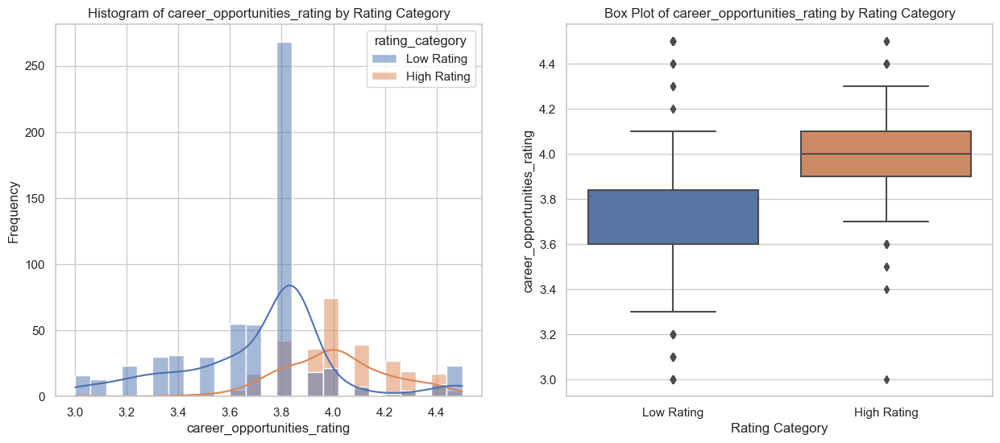

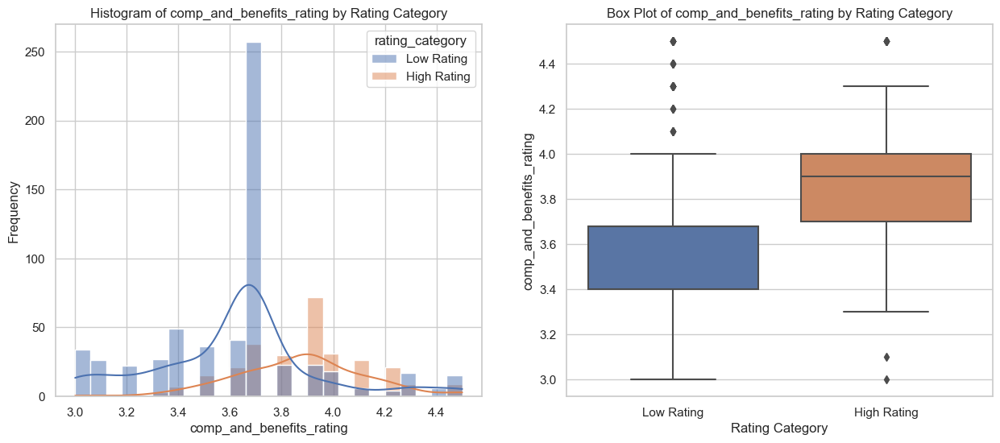

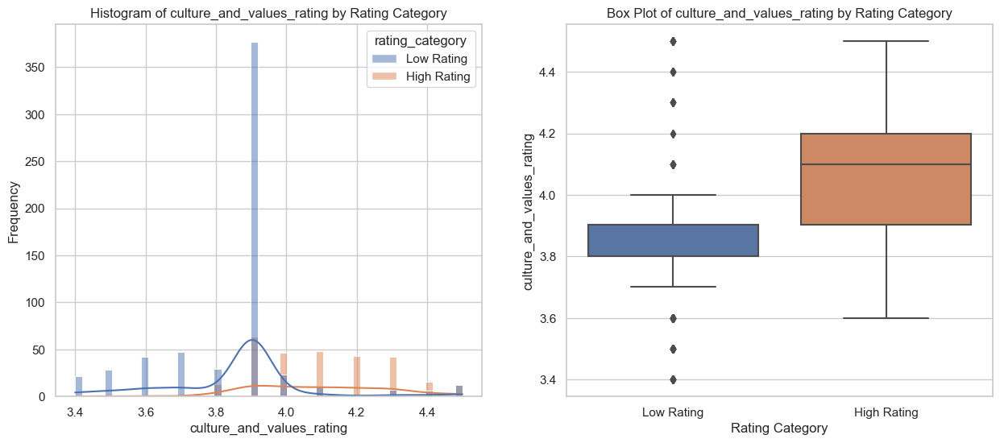

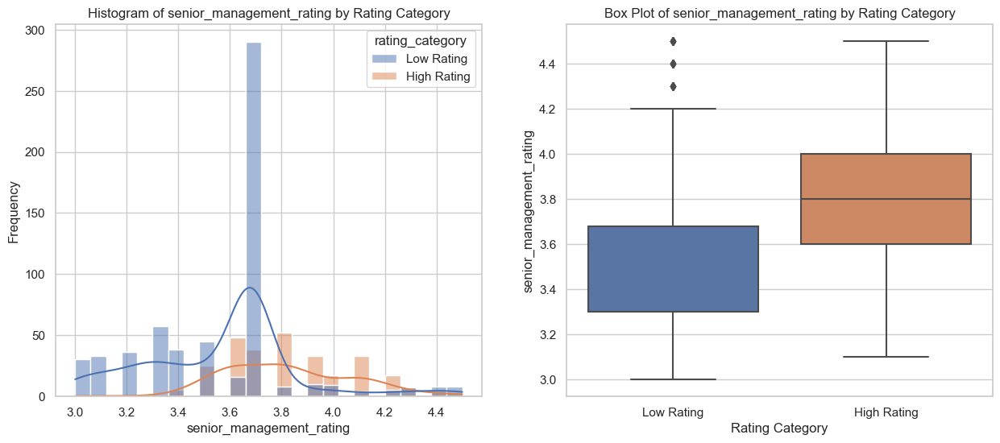

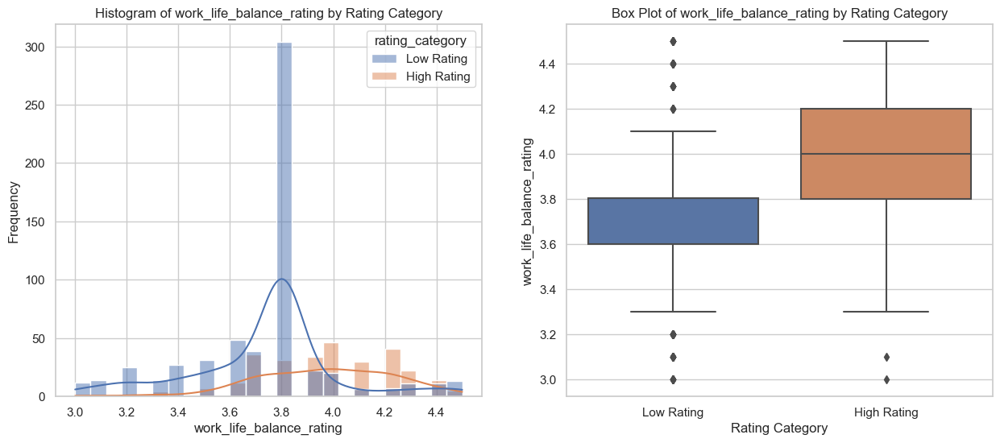

In [142]:
import seaborn as sns
import matplotlib.pyplot as plt

numerical_columns = [ 'career_opportunities_rating', 'comp_and_benefits_rating',
                      'culture_and_values_rating', 'senior_management_rating', 'work_life_balance_rating']

for column in numerical_columns:
    fig, ax = plt.subplots(1, 2, figsize=(15, 6))

    
    sns.histplot(x=job_data[column], hue=job_data['rating_category'], kde=True, ax=ax[0])
    ax[0].set_title(f'Histogram of {column} by Rating Category')
    ax[0].set_xlabel(column)
    ax[0].set_ylabel('Frequency')

    sns.boxplot(x='rating_category', y=column, data=job_data, ax=ax[1])
    ax[1].set_title(f'Box Plot of {column} by Rating Category')
    ax[1].set_xlabel('Rating Category')
    ax[1].set_ylabel(column)

    plt.show()


In [143]:
# LEVEL 3 ANALYSIS

In [146]:
print(job_data.head(10))

               company                                          job_title  \
0                  ABB                                Junior Data Analyst   
1              Philips                             Data Scientist - AI/ML   
2                 HSBC                                 Data Science GSC’s   
3    Facctum Solutions                                       Data Analyst   
4  JPMorgan Chase & Co                     Data and Analytics - Associate   
5           Sanfoundry                           Data Scientist - Fresher   
6               Beinex                            Trainee in Data Science   
7           Sanfoundry  Junior Software Engineer - Data Science - Fresher   
8               Oracle                                     Data Scientist   
9              PhonePe                                     Data Scientist   

   company_rating                                    job_description  \
0        4.000000  Junior Data Analyst\nTake your next career ste...   
1       

In [147]:
high_rating_data = job_data[job_data['rating_category'] == 'High Rating']


In [148]:
## Plotting preferences for job titles


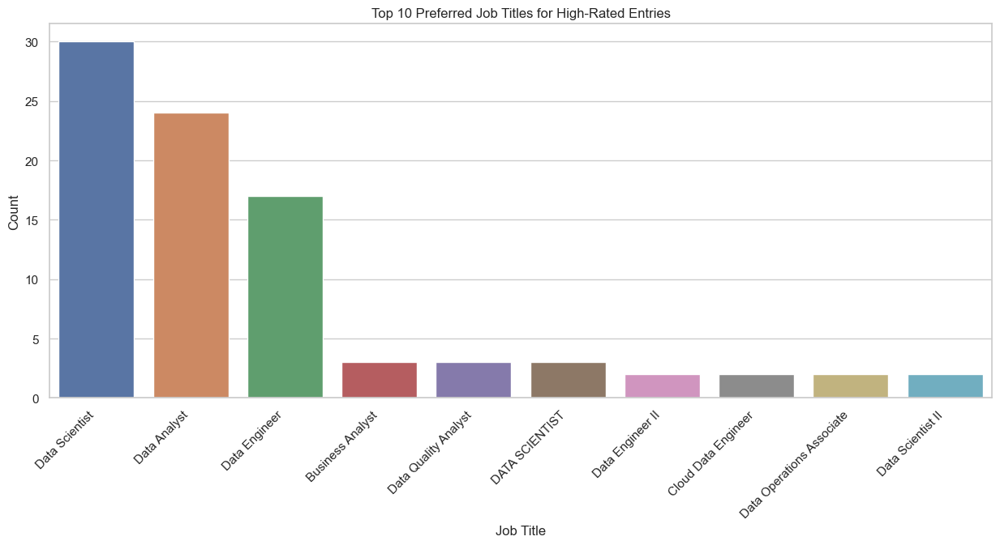

In [149]:
plt.figure(figsize=(15, 6))
sns.countplot(x='job_title', data=high_rating_data, order=high_rating_data['job_title'].value_counts().index[:10])
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Preferred Job Titles for High-Rated Entries')
plt.xlabel('Job Title')
plt.ylabel('Count')
plt.show()


In [150]:
## Plotting preferences for industries


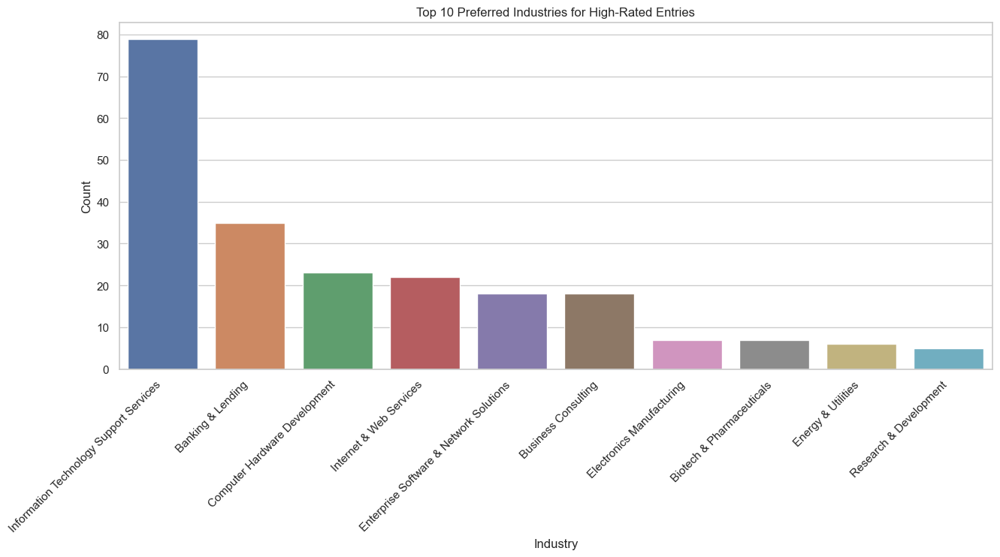

In [151]:
plt.figure(figsize=(15, 6))
sns.countplot(x='industry', data=high_rating_data, order=high_rating_data['industry'].value_counts().index[:10])
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Preferred Industries for High-Rated Entries')
plt.xlabel('Industry')
plt.ylabel('Count')
plt.show()

In [152]:
## Plotting preferences for employment types


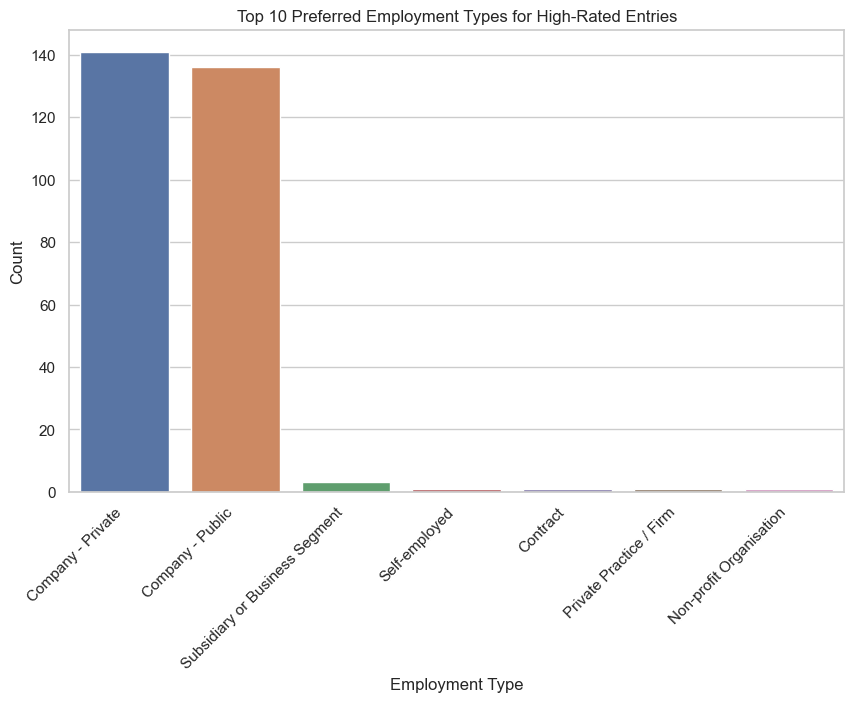

In [153]:
plt.figure(figsize=(10, 6))
sns.countplot(x='employment_type', data=high_rating_data, order=high_rating_data['employment_type'].value_counts().index[:10])
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Preferred Employment Types for High-Rated Entries')
plt.xlabel('Employment Type')
plt.ylabel('Count')
plt.show()

In [154]:
## Plotting preferences for job titles


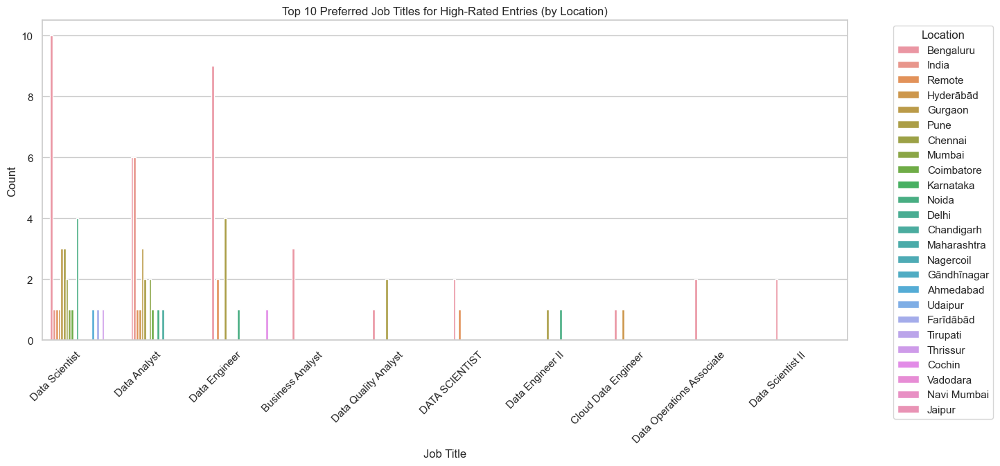

In [155]:
plt.figure(figsize=(15, 6))
sns.countplot(x='job_title', hue='location', data=high_rating_data, order=high_rating_data['job_title'].value_counts().index[:10])
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Preferred Job Titles for High-Rated Entries (by Location)')
plt.xlabel('Job Title')
plt.ylabel('Count')
plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


In [156]:
## Plotting preferences for industries


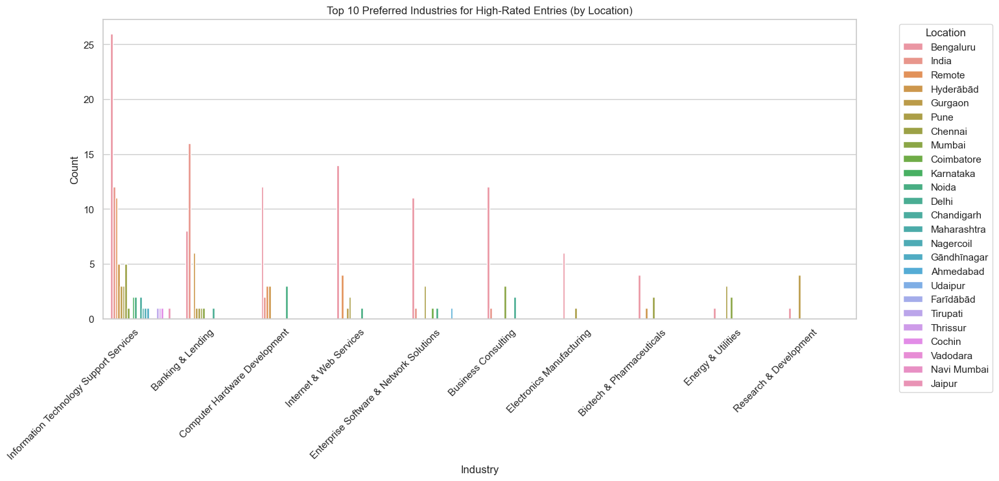

In [157]:
plt.figure(figsize=(15, 6))
sns.countplot(x='industry', hue='location', data=high_rating_data, order=high_rating_data['industry'].value_counts().index[:10])
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Preferred Industries for High-Rated Entries (by Location)')
plt.xlabel('Industry')
plt.ylabel('Count')
plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


In [158]:
## Plotting preferences for employment types


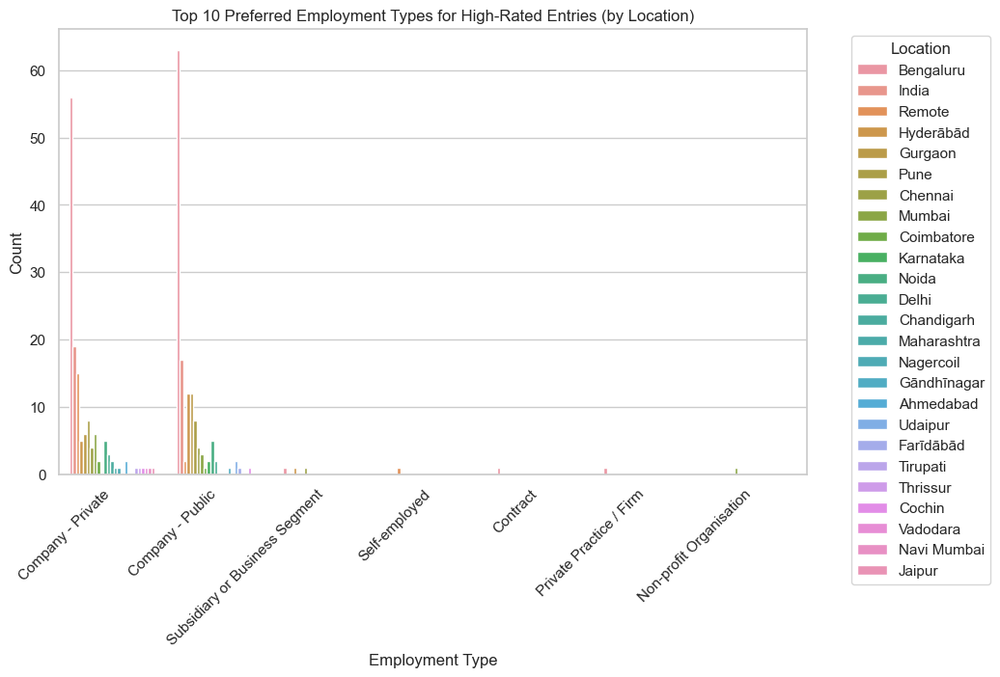

In [159]:
plt.figure(figsize=(10, 6))
sns.countplot(x='employment_type', hue='location', data=high_rating_data, order=high_rating_data['employment_type'].value_counts().index[:10])
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Preferred Employment Types for High-Rated Entries (by Location)')
plt.xlabel('Employment Type')
plt.ylabel('Count')
plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


In [ ]:
## Additional comparison for sector


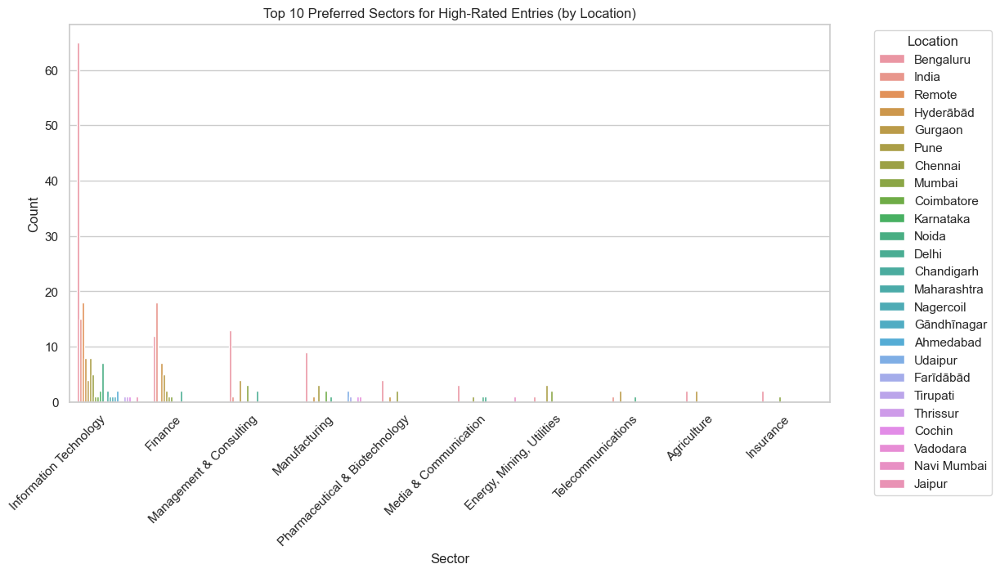

In [160]:
plt.figure(figsize=(12, 6))
sns.countplot(x='sector', hue='location', data=high_rating_data, order=high_rating_data['sector'].value_counts().index[:10])
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Preferred Sectors for High-Rated Entries (by Location)')
plt.xlabel('Sector')
plt.ylabel('Count')
plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [162]:
##comparing numerical columns like salary_avg_estimate, career_opportunities_rating, and work_life_balance_rating against company:

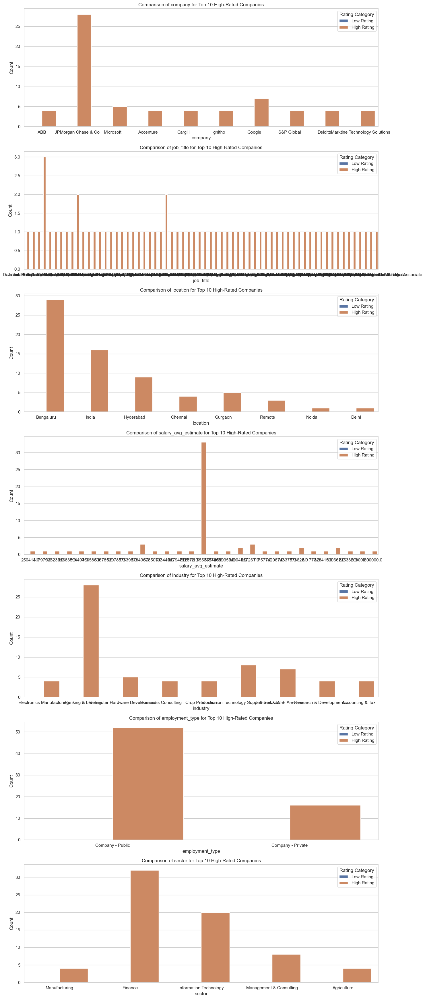

In [169]:
import seaborn as sns
import matplotlib.pyplot as plt


columns_to_compare = ['company', 'job_title', 'location', 'salary_avg_estimate', 'industry', 'employment_type', 'sector']

top_10_high_rated_company = job_data[job_data['rating_category'] == 'High Rating'].groupby('company').size().nlargest(10).reset_index(name='count')
top_10_high_rated_data = job_data[job_data['company'].isin(top_10_high_rated_company['company'])]

fig, axes = plt.subplots(nrows=len(columns_to_compare), ncols=1, figsize=(15, 5 * len(columns_to_compare)))

for i, column in enumerate(columns_to_compare):
    sns.countplot(x=column, hue='rating_category', data=top_10_high_rated_data, ax=axes[i])
    axes[i].set_title(f'Comparison of {column} for Top 10 High-Rated Companies')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Count')
    axes[i].legend(title='Rating Category')

plt.tight_layout()
plt.show()
